In [1]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy.ma as ma
import glob
from collections import namedtuple, OrderedDict
import netCDF4 as nc
import os
import scipy
import scipy.io as sio
from scipy import interpolate, signal
from pyproj import Proj,transform
import sys
sys.path.append('/ocean/ssahu/CANYONS/wcvi/grid/')
from bathy_common import *
from matplotlib import path
from salishsea_tools import viz_tools
import xarray as xr
from salishsea_tools import nc_tools
import scipy.io as sio
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import cmocean as cmo
import matplotlib.gridspec as gridspec
%matplotlib inline
from scipy.io import loadmat
from scipy.interpolate import griddata
from dateutil.parser import parse
from salishsea_tools import geo_tools, viz_tools, tidetools, nc_tools
import gsw
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import seaborn as sns
from windrose import plot_windrose
from windrose import WindroseAxes


from dateutil        import parser
from datetime import datetime

sns.set_context('poster')
sns.set_style('dark')

/home/ssahu/anaconda3/lib/python3.5/site-packages/xarray/conventions.py:9: FutureWarning: The pandas.tslib module is deprecated and will be removed in a future version.
  from pandas.tslib import OutOfBoundsDatetime


In [ ]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]
y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


# nc_file = nc.Dataset('/data/ssahu/ARIANE/LB_08/LB_08_big_box.nc')

nc_file = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/isopyncal_263/right_traj.nc')
nc_tools.show_variables(nc_file)

odict_keys(['init_x', 'init_y', 'init_z', 'init_t', 'init_age', 'init_transp', 'final_x', 'final_y', 'final_z', 'final_t', 'final_age', 'final_transp', 'traj_lon', 'traj_lat', 'traj_depth', 'traj_time', 'traj_temp', 'traj_salt', 'traj_dens'])


In [3]:


init_x = nc_file.variables['init_x']
init_z = nc_file.variables['init_z']
init_age = nc_file.variables['init_age']

traj_depth = nc_file.variables['traj_depth'][:]
traj_lon   = nc_file.variables['traj_lon'][:]
traj_lat   = nc_file.variables['traj_lat'][:]
traj_rho   = nc_file.variables['traj_dens'][:]
traj_tem   = nc_file.variables['traj_temp'][:]
traj_sal   = nc_file.variables['traj_salt'][:]
traj_time  = nc_file.variables['traj_time']


final_age = nc_file.variables['final_age']


# lon1=nc_file.variables['traj_lon'][:]
# lat1=nc_file.variables['traj_lat'][:]
# dep1=nc_file.variables['traj_depth'][:]
x1=nc_file.variables['init_x'][:]
y1=nc_file.variables['init_y'][:]
t1=nc_file.variables['traj_time'][:]

x2=nc_file.variables['final_x'][:]
y2=nc_file.variables['final_y'][:]


final_z = nc_file.variables['final_z'][:]

final_age_days = final_age[:]/(3600)

/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:10: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:12: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type


In [4]:
x_final = []
y_final = []


for i in np.arange(x2.shape[0]):
    x_final = np.append(arr=x_final,values=x_wcvi_slice[np.int(np.rint(x2[i]))-1])
    y_final = np.append(arr=y_final,values=y_wcvi_slice[np.int(np.rint(y2[i]))-1])

In [6]:
def plot_particle_track(particle_ind):
    
    part = particle_ind
    
    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']


    lon = bathy['nav_lon'][...]
    lat = bathy['nav_lat'][...]



    file_model = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d_20130429_20131025_grid_T_20130429-20130508.nc')

    lon_small = file_model.variables['nav_lon'][1:,1:]
    lat_small = file_model.variables['nav_lat'][1:,1:]




    cmap=plt.cm.get_cmap('nipy_spectral')
    #     cmap = plt.cm.get_cmap('gist_rainbow')
    cmap.set_bad('#8b7765')
    cmin = 0
    cmax = 300

    import matplotlib as mpl
    #     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

    fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
    CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
    CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


    # part = ind[0]
    # for part in ind[139]:

    for k in np.arange(0,np.int(final_age_days[part]),10):
        y, x = geo_tools.find_closest_model_point(traj_lon[k,part],traj_lat[k,part],\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
        track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[part]))-1], y_wcvi_slice[np.int(np.rint(y1[part]))-1], s=500, marker = '*', c = 'magenta', alpha=0.9, edgecolor= 'orangered')
        q = ax.scatter(x, y, c = np.multiply(-1,np.ma.array(traj_depth[k,part]).filled()), cmap = cmap, vmin = cmin, vmax= cmax, s=100, alpha=0.9)#, edgecolor= 'cyan')

        t = np.int(np.rint(120 - traj_time[k,part]*120))
        level = np.int(np.rint((np.abs(zlevels - (-traj_depth[k,part]))).argmin()))



        j, i = geo_tools.find_closest_model_point(traj_lon[k,part],traj_lat[k,part],\
                                                  lon_small,lat_small,grid='NEMO',tols=\
                                                  {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                                   'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 


    #     quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_rho_0[::arrow_step,::arrow_step], v_rho_0[::arrow_step,::arrow_step] , speeds[::arrow_step,::arrow_step], pivot='mid', cmap = cmap, width=0.005, minshaft= 0.5)
    #     quiver = ax.quiver(x, y, u_tzyx_loc, v_tzyx_loc , color = 'blue', cmap = cmap, pivot='tail', width=0.003, minshaft= 0.5)
    # #     legend = ax.legend(loc='best', fancybox=True, framealpha=0.25, fontsize =16)
    # ax.quiverkey(quiver, 610, 320,  0.1, r'0.1 m/sec', coordinates = 'data')

    ax.set_xlabel('x index', fontsize =16)
    ax.set_ylabel('y index', fontsize = 16)
    ax.tick_params(axis='both',labelsize =16)


    # ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
    ax.legend(loc = 'best')

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

    ax.grid()

    cbar = fig.colorbar(q, ax=ax)
    cbar.set_label(label='Depth ($m$)', fontsize = 16)
    cbar.ax.tick_params(labelsize=16)
    fig.tight_layout()
    
    
    
def plot_pie_diagram(off_percentage, south_percentage, cuc_percentage, juan_percentage, north_percentage):

    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']


    lon = bathy['nav_lon'][...]
    lat = bathy['nav_lat'][...]




    cmap=plt.cm.get_cmap('nipy_spectral')
    #     cmap = plt.cm.get_cmap('gist_rainbow')
    cmap.set_bad('#8b7765')
    cmin = 0
    cmax = 300

    import matplotlib as mpl
    #     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

    fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
    CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
    CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


    # # part = ind[0]
    # for part in ind[-5:-1]:
    #     for k in np.arange(traj_depth.shape[0]):
    #         y, x = geo_tools.find_closest_model_point(traj_lon[k,part],traj_lat[k,part],\
    #                                       lon,lat,grid='NEMO',tols=\
    #                                       {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
    #                                        'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
    #         track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[part]))-1], y_wcvi_slice[np.int(np.rint(y1[part]))-1], s=500, marker = '*', c = 'magenta', alpha=0.9, edgecolor= 'orangered')
    #         q = ax.scatter(x, y, c = np.multiply(-1,np.ma.array(traj_depth[k,part]).filled()), cmap = cmap, vmin = cmin, vmax= cmax, s=10, alpha=0.5)#, edgecolor= 'cyan')



    ax.set_xlabel('x index', fontsize =16)
    ax.set_ylabel('y index', fontsize = 16)
    ax.tick_params(axis='both',labelsize =16)
    for k in np.arange(x1.shape[0]):
        ax.scatter(x_wcvi_slice[np.int(x1[k]-1)],y_wcvi_slice[np.int(y1[k]-1)], marker = '*', c = 'red', s = 10, linewidths=3)
    

    # ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
    ax.legend(loc = 'best')

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

    x = [520,575]
    y = [320,200]
    ax.plot(x, y , 'bo-')


    ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
    ax.hlines(y = 320, xmin = 520, xmax=590, color = 'b')
    ax.grid()

    axins = inset_axes(ax, width="50%", height="75%",
                       bbox_to_anchor=(.085, .18, .5, .5),
                       bbox_transform=ax.transAxes, loc=3)
    axins.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)

    axins.tick_params(
        axis='y',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)


    labels = 'Offshore', 'From South', 'CUC','Strait outflow', 'From North', 'Shelf water'
    sizes = [off_percentage, south_percentage, cuc_percentage, juan_percentage, north_percentage, \
             100- (off_percentage + south_percentage + cuc_percentage + juan_percentage + north_percentage)]
    explode = (0, 0.1, 0.1, 0, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

    # fig, ax = plt.subplots(figsize=(30, 10), subplot_kw=dict(aspect="equal"))

    size = 0.35
    vals = np.array([[9.5, 0], [10.2, 0], [12.3, 0], [25.4, 51.7-25.4]])

    cmap = plt.get_cmap("tab20c")
    outer_colors = cmap(np.arange(4)*4)
    inner_colors = cmap(np.arange(5)*4)#cmap(np.array([1, 4, 7, 10, 13, 25]))

    axins.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
            shadow=True, startangle=90)
    axins.axis('equal') 
    # axins.set_title("Particles at all depths")

    # # For visualization purposes we mark the bounding box by a rectangle
    # ax.add_patch(plt.Rectangle((.2, .4), .6, .5, ls="--", ec="c", fc="None",
    #                            transform=ax.transAxes))

    # ax.legend(loc = 'best')
    # cbar = fig.colorbar(q, ax=ax)
    # cbar.set_label(label='Depth ($m$)', fontsize = 16)
    # cbar.ax.tick_params(labelsize=16)
    fig.tight_layout()









/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


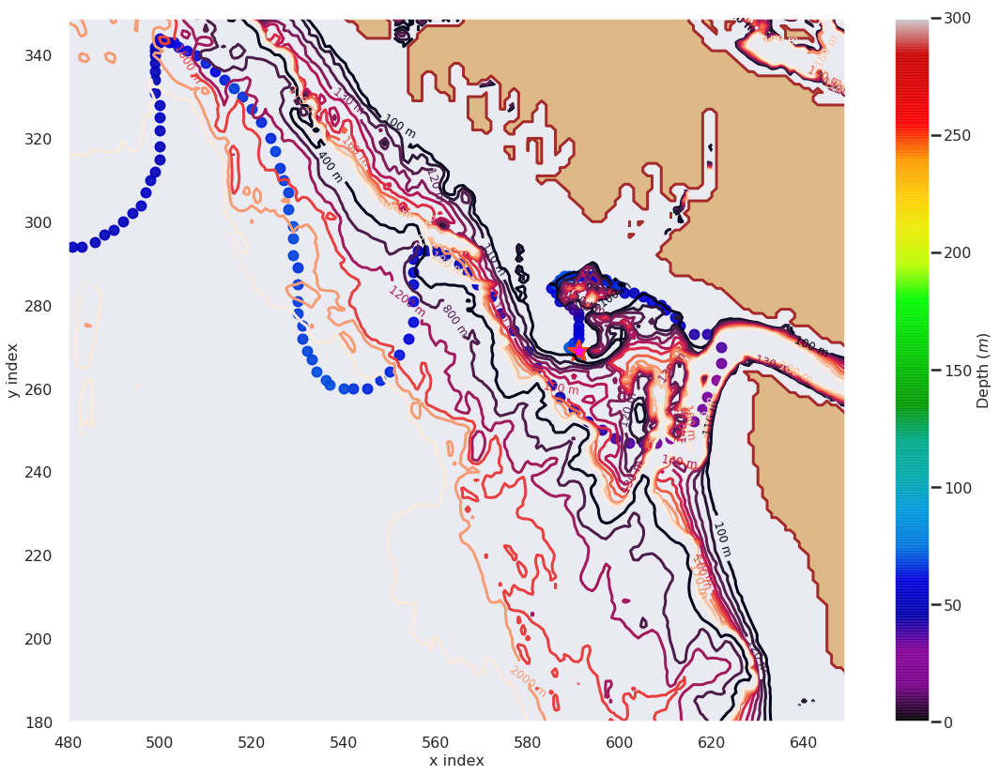

In [15]:
plot_particle_track(particle_ind=0)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


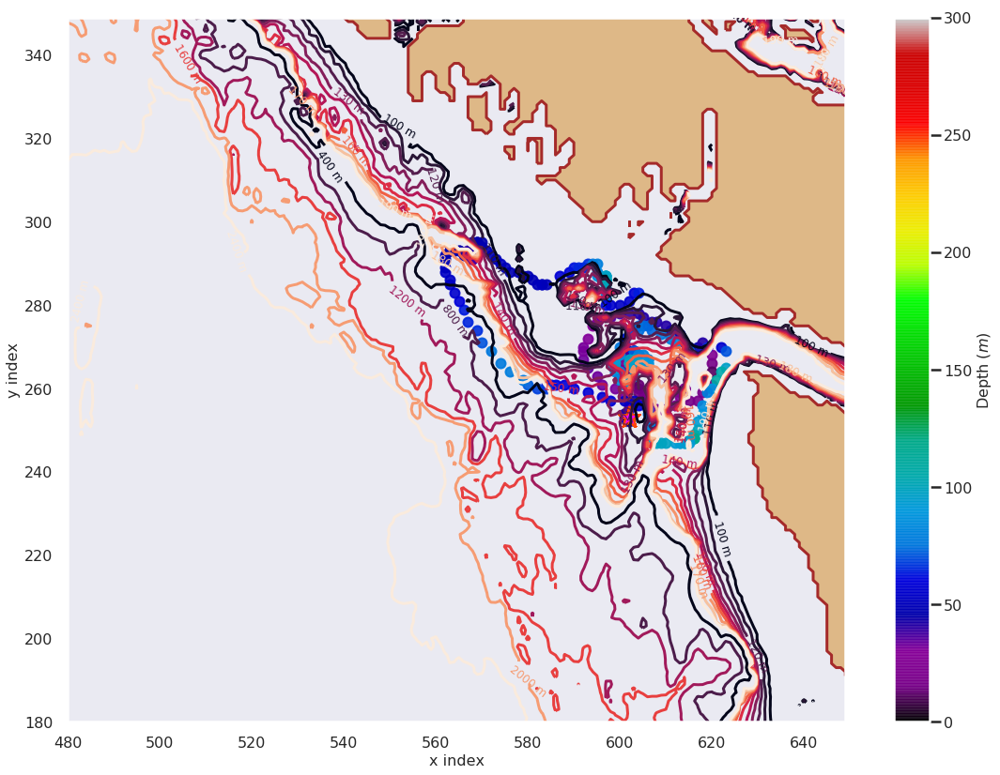

In [21]:
plot_particle_track(particle_ind=49)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


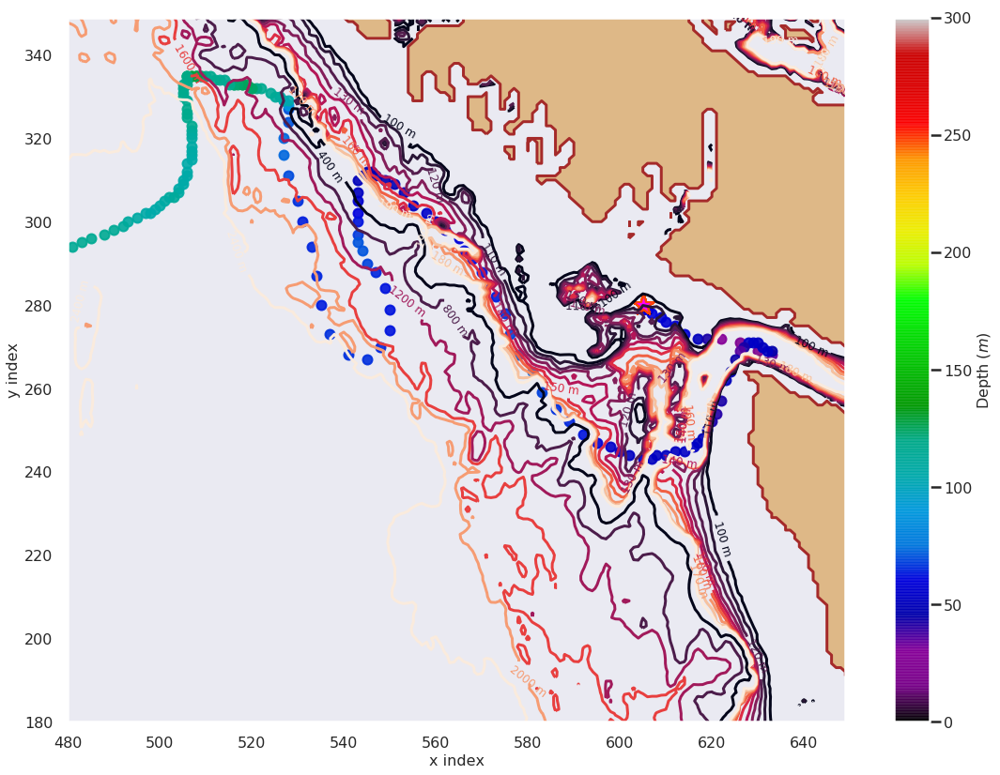

In [22]:
plot_particle_track(particle_ind=99)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


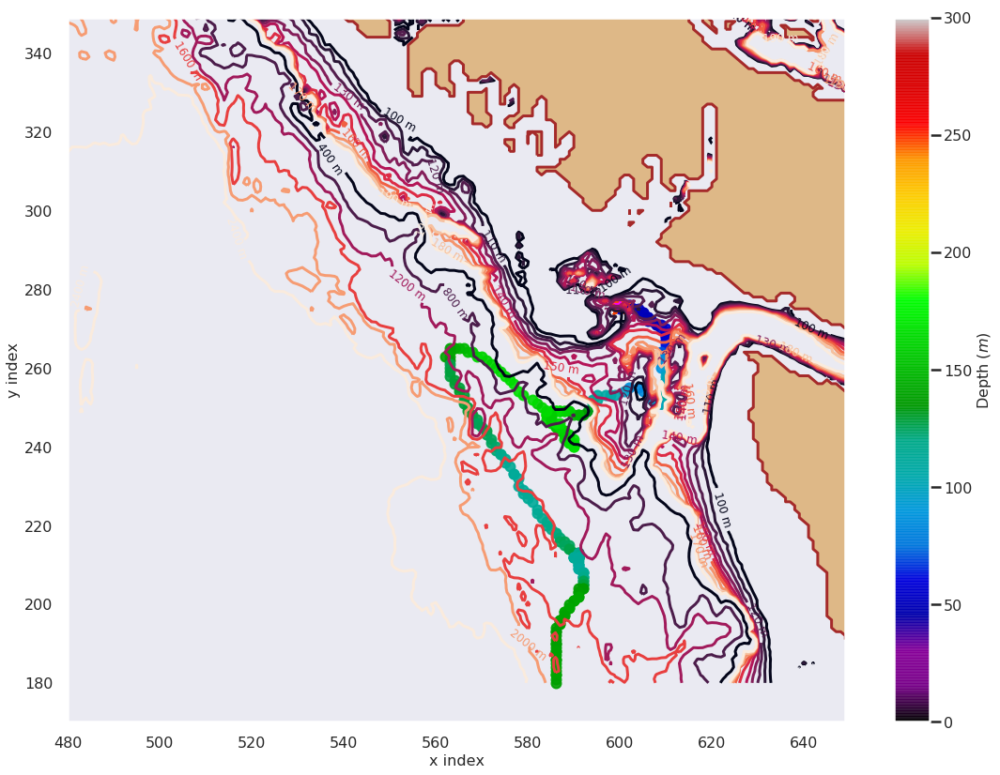

In [23]:
plot_particle_track(particle_ind=149)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


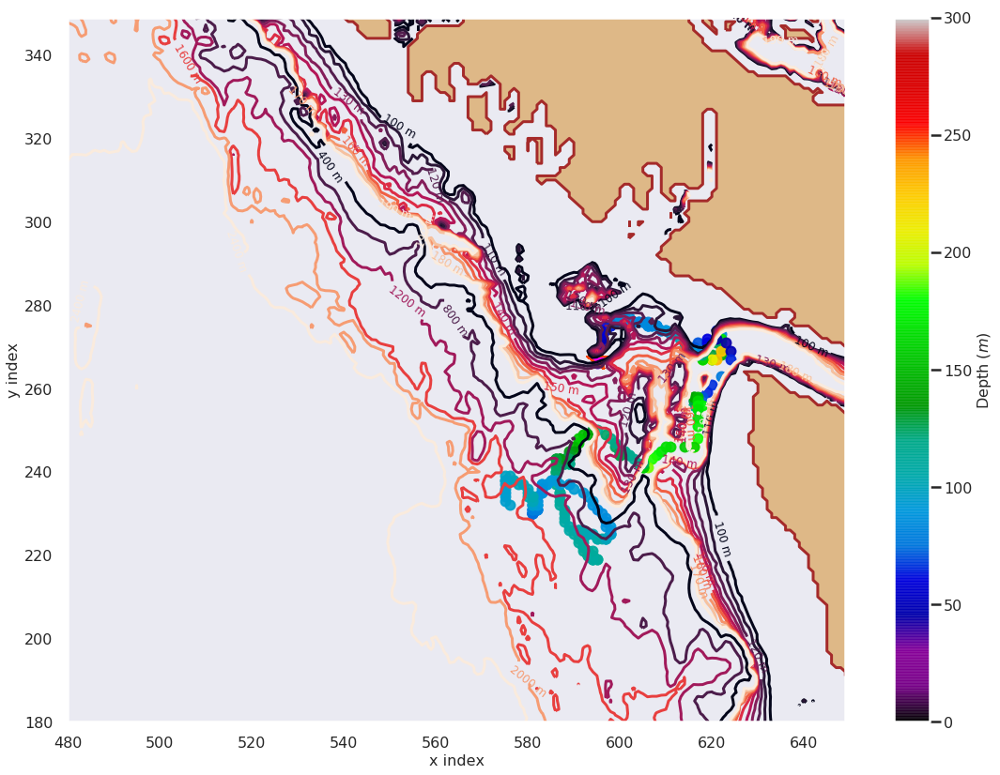

In [24]:
plot_particle_track(particle_ind=199)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


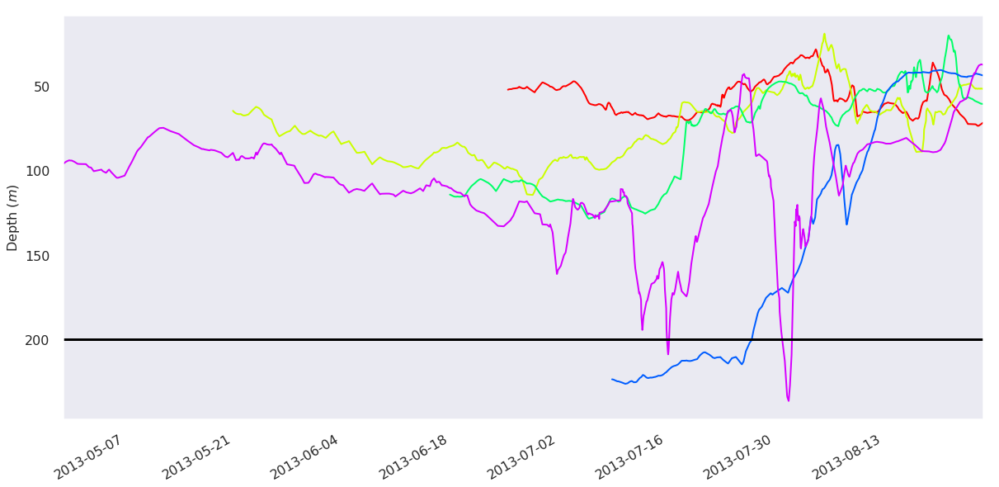

In [29]:
colors = cm.hsv(np.linspace(0, 1, traj_depth.shape[1]))

colors_edge = cm.afmhot_r(np.linspace(0, 1, traj_depth.shape[1]))



date1 = '2013-08-26'
date2 = '2013-04-29'
mydates = pd.date_range(date2, date1, freq= '60min')


fig, ax1 = plt.subplots(1, 1, figsize=(20,10))

for traj_depth_level in np.arange(0,traj_depth.shape[1],50):
    
#     if np.ma.is_masked(traj_depth[0,traj_depth_level]) == False:

    ax1.plot(np.flip(mydates, axis=0) , np.multiply(-1,traj_depth[:mydates.shape[0],traj_depth_level]) , color = colors[traj_depth_level] ,linewidth=2)


ax1.axhline(y=200, color = 'k')

ax1.tick_params(axis='both',labelsize =16)
ax1.set_ylabel('Depth ($m$)', fontsize = 16)# and Wind stress (*10^3) (N/m^2)', fontsize = 16)
ax1.grid()
ax1.tick_params(axis='both',labelsize =16, color = colors[traj_depth_level])

ax1.set_ylim(ax1.get_ylim()[::-1]) 
ax1.legend(loc='best', fontsize = 14)
ax1.grid()
ax1.set_xlim(mydates[0], mydates[-1])
fig.autofmt_xdate()



In [109]:
num_north = np.round(a=final_age[(x_final < 580) & (y_final > 300)].shape[0]/final_z.shape[0], decimals=3)

north_percent = 100*num_north

print(north_percent)

num_cuc = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0].shape[0]/final_z.shape[0], decimals = 3)

cuc_percent = 100*num_cuc

print(cuc_percent)

num_south = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0].shape[0]/final_z.shape[0], decimals = 3)

south_percent = 100*num_south

print(south_percent)

### Bigger box
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))



# num = np.where((y_final[x_final_off] < y_final_off))[0].shape[0] + np.where((x_final<x_final_off[0]) & \
#                                                                       ((y_final > 200)&(y_final<320)))[0].shape[0]

# num_off = num/final_z.shape[0]
num_off = off_ind.shape[0]/final_z.shape[0]
off_percent = np.round(a=100*num_off, decimals=1)

print(off_percent)

num_juan = np.round(a=np.where((x_final > 635))[0].shape[0]/final_z.shape[0], decimals=3)

juan_percent = num_juan*100

print(juan_percent)

7.8
18.8
29.4
9.0
4.1


In [15]:
sns.set_context('talk')

For particles correctly predicted by model on 26.3 isopycncal


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/figure.py:1743: UserWarning: This figure includes Axes that are not compatible with tight_layout, so its results might be incorrect.
  warnings.warn("This figure includes Axes that are not "


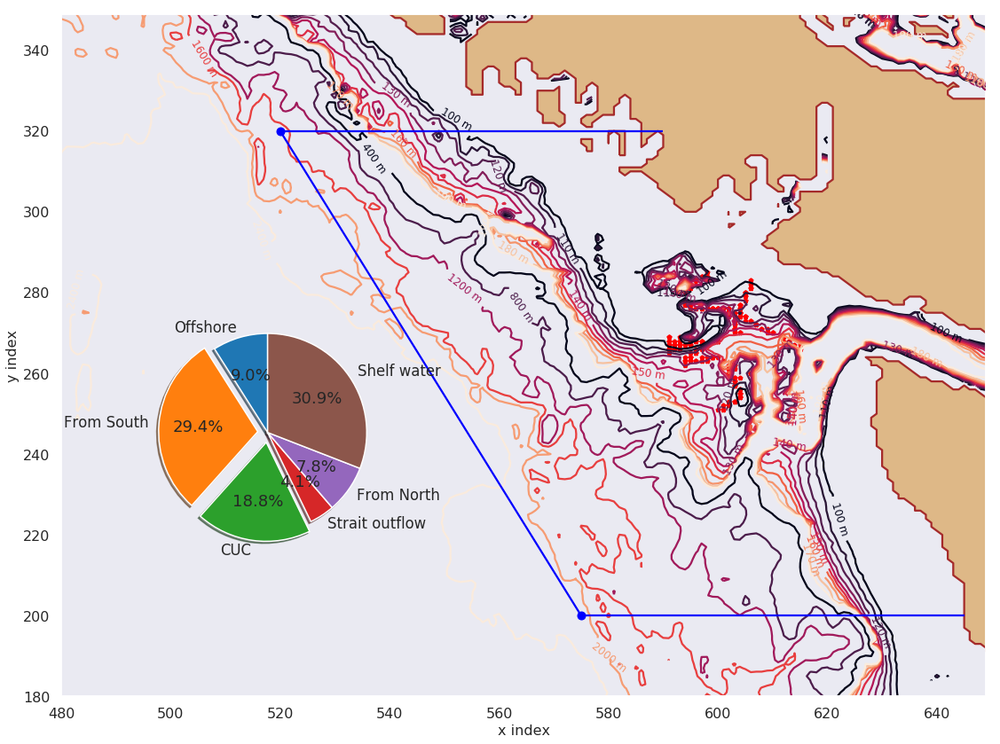

In [115]:
print("For particles correctly predicted by model on 26.3 isopycncal")


plot_pie_diagram(cuc_percentage=cuc_percent, juan_percentage=juan_percent, \
                 north_percentage=north_percent, south_percentage=south_percent, \
                 off_percentage=off_percent)

In [44]:
traj_tem_last   = np.empty_like(final_age_days)
traj_sal_last   = np.empty_like(final_age_days)
traj_rho_last   = np.empty_like(final_age_days)
traj_depth_last = np.empty_like(final_age_days)


for r in np.arange(traj_tem_last.shape[0]):
    traj_tem_last[r]  =  traj_tem[np.int(final_age_days[r]),r]
    traj_sal_last[r]  =  traj_sal[np.int(final_age_days[r]),r]
    traj_rho_last[r]  =  traj_rho[np.int(final_age_days[r]),r]
    traj_depth_last[r] = traj_depth[np.int(final_age_days[r]),r]
    

In [47]:
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

p1= (x[0],y[0])
p1 = np.asarray(p1)
p2 = (x[1], y[1])
p2 = np.asarray(p2)

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

p_lb08 = (i,j)

d = np.empty_like(x_final)

off_ind = []


for r in np.arange(x_final.shape[0]):

    p3 = (x_final[r], y_final[r])
    p3 = np.asarray(p3)
    d[r] =np.cross(p2-p1,p3-p1)/np.linalg.norm(p2-p1)
    
    if ((d[r] < 0) & (x_final[r] < 575)):
        off_ind = np.append(arr=off_ind, values=np.int(r))

In [50]:
traj_tem_final_cuc = traj_tem_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_sal_final_cuc = traj_sal_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_rho_final_cuc = traj_rho_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]


traj_depth_final_cuc = traj_depth_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_days_final_cuc = final_age_days[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]/24

traj_tem_final_cuc = traj_tem_final_cuc[~(traj_tem_final_cuc == 1.0000000200408773e+20)]

traj_sal_final_cuc = traj_sal_final_cuc[~(traj_sal_final_cuc == 1.0000000200408773e+20)]

traj_depth_final_cuc  = traj_depth_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]
traj_days_final_cuc   = traj_days_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]
traj_rho_final_cuc    = traj_rho_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]



traj_tem_final_north = traj_tem_last[((x_final < 580) & (y_final > 320))]
traj_tem_final_north = traj_tem_final_north[~(traj_tem_final_north == 1.0000000200408773e+20)]

traj_sal_final_north = traj_sal_last[((x_final < 580) & (y_final > 320))]
traj_sal_final_north = traj_sal_final_north[~(traj_sal_final_north == 1.0000000200408773e+20)]

traj_rho_final_north = traj_rho_last[((x_final < 580) & (y_final > 320))]
traj_depth_final_north = traj_depth_last[((x_final < 580) & (y_final > 320))]
traj_days_final_north  = final_age_days[((x_final < 580) & (y_final > 320))]/24

traj_depth_final_north  = traj_depth_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]
traj_days_final_north   = traj_days_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]
traj_rho_final_north = traj_rho_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]



traj_tem_final_south = traj_tem_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_sal_final_south = traj_sal_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_rho_final_south = traj_rho_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_depth_final_south = traj_depth_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]
traj_days_final_south  = final_age_days[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]/24


traj_tem_final_south = traj_tem_final_south[~(traj_tem_final_south == 1.0000000200408773e+20)]

traj_sal_final_south = traj_sal_final_south[~(traj_sal_final_south == 1.0000000200408773e+20)]


traj_depth_final_south = traj_depth_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]
traj_days_final_south  = traj_days_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]
traj_rho_final_south = traj_rho_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]


traj_tem_final_juan = traj_tem_last[(x_final > 648)]
traj_tem_final_juan = traj_tem_final_juan[~(traj_tem_final_juan == 1.0000000200408773e+20)]

traj_sal_final_juan = traj_sal_last[(x_final > 648)]
traj_sal_final_juan = traj_sal_final_juan[~(traj_sal_final_juan == 1.0000000200408773e+20)]

traj_rho_final_juan = traj_rho_last[(x_final > 648)]

traj_depth_final_juan = traj_depth_last[(x_final > 648)]
traj_days_final_juan = final_age_days[(x_final > 648)]/24

traj_depth_final_juan = traj_depth_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]
traj_days_final_juan  = traj_days_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]
traj_rho_final_juan = traj_rho_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]



x = [510,575]
y = [320,200]

coefficients = np.polyfit(x, y, 1)
x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

# num = np.where((y_final[x_final_off] < y_final_off))[0].shape[0] + np.where((x_final<x_final_off[0]) & \
#                                                                       ((y_final > 200)&(y_final<320)))[0].shape[0]

traj_tem_final_off = []
# traj_tem_final_off = np.append(arr=traj_tem_final_off, \
#                                values= traj_tem_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_tem_final_off = np.append(arr=traj_tem_final_off, \
#                                values = traj_tem_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
# traj_tem_final_off = traj_tem_final_off[~(traj_tem_final_off == 1.0000000200408773e+20)]

traj_sal_final_off = []
# traj_sal_final_off = np.append(arr=traj_sal_final_off, \
#                                values= traj_sal_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_sal_final_off = np.append(arr=traj_sal_final_off, \
#                                values = traj_sal_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
# traj_sal_final_off = traj_sal_final_off[~(traj_sal_final_off == 1.0000000200408773e+20)]


traj_rho_final_off = []

# traj_rho_final_off = np.append(arr=traj_rho_final_off, \
#                                values= traj_rho_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_rho_final_off = np.append(arr=traj_rho_final_off, \
#                                values = traj_rho_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])


# traj_depth_final_off = []
# traj_depth_final_off = np.append(arr=traj_depth_final_off, \
#                                values= traj_depth_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_depth_final_off = np.append(arr=traj_depth_final_off, \
#                                values = traj_depth_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
traj_depth_final_off = []
traj_days_final_off = []

for l in np.arange(off_ind.shape[0]):

    traj_depth_final_off = np.append(arr=traj_depth_final_off, values=traj_depth_last[np.int(off_ind[l])])
    traj_days_final_off = np.append(arr=traj_days_final_off, values=final_age_days[np.int(off_ind[l])]/24)
    traj_rho_final_off   = np.append(arr=traj_rho_final_off, values=traj_rho_last[np.int(off_ind[l])])
    traj_tem_final_off   = np.append(arr=traj_tem_final_off, values=traj_tem_last[np.int(off_ind[l])])
    traj_sal_final_off   = np.append(arr=traj_sal_final_off, values=traj_sal_last[np.int(off_ind[l])])


traj_depth_final_off = traj_depth_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]
traj_days_final_off  = traj_days_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]
traj_rho_final_off = traj_rho_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]

In [52]:
sns.set_context('talk')

In [68]:
pressure_loc_cuc = np.empty_like(traj_depth_final_cuc)
SA_loc_cuc       = np.empty_like(traj_depth_final_cuc)
CT_loc_cuc       = np.empty_like(traj_depth_final_cuc)
spic_loc_cuc     = np.empty_like(traj_depth_final_cuc)



for i in np.arange(traj_depth_final_cuc.shape[0]):
    
    pressure_loc_cuc[i] = gsw.p_from_z(traj_depth_final_cuc[i],np.mean(traj_lat))
    
    SA_loc_cuc[i] = gsw.SA_from_SP(traj_sal_final_cuc[i], pressure_loc_cuc[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_cuc[i] = gsw.CT_from_pt(traj_sal_final_cuc[i], traj_tem_final_cuc[i])
    
    spic_loc_cuc[i] = gsw.spiciness0(SA_loc_cuc[i], CT_loc_cuc[i])
    
pressure_loc_off = np.empty_like(traj_depth_final_off)
SA_loc_off       = np.empty_like(traj_depth_final_off)
CT_loc_off       = np.empty_like(traj_depth_final_off)
spic_loc_off     = np.empty_like(traj_depth_final_off)



for i in np.arange(traj_depth_final_off.shape[0]):
    
    pressure_loc_off[i] = gsw.p_from_z(traj_depth_final_off[i],np.mean(traj_lat))
    
    SA_loc_off[i] = gsw.SA_from_SP(traj_sal_final_off[i], pressure_loc_off[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_off[i] = gsw.CT_from_pt(traj_sal_final_off[i], traj_tem_final_off[i])
    
    spic_loc_off[i] = gsw.spiciness0(SA_loc_off[i], CT_loc_off[i])
    
pressure_loc_south = np.empty_like(traj_depth_final_south)
SA_loc_south       = np.empty_like(traj_depth_final_south)
CT_loc_south       = np.empty_like(traj_depth_final_south)
spic_loc_south     = np.empty_like(traj_depth_final_south)



for i in np.arange(traj_depth_final_south.shape[0]):
    
    pressure_loc_south[i] = gsw.p_from_z(traj_depth_final_south[i],np.mean(traj_lat))
    
    SA_loc_south[i] = gsw.SA_from_SP(traj_sal_final_south[i], pressure_loc_south[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_south[i] = gsw.CT_from_pt(traj_sal_final_south[i], traj_tem_final_south[i])
    
    spic_loc_south[i] = gsw.spiciness0(SA_loc_south[i], CT_loc_south[i])
    
pressure_loc_north= np.empty_like(traj_depth_final_north)
SA_loc_north       = np.empty_like(traj_depth_final_north)
CT_loc_north       = np.empty_like(traj_depth_final_north)
spic_loc_north     = np.empty_like(traj_depth_final_north)



for i in np.arange(traj_depth_final_north.shape[0]):
    
    pressure_loc_north[i] = gsw.p_from_z(traj_depth_final_north[i],np.mean(traj_lat))
    
    SA_loc_north[i] = gsw.SA_from_SP(traj_sal_final_north[i], pressure_loc_north[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_north[i] = gsw.CT_from_pt(traj_sal_final_north[i], traj_tem_final_north[i])
    
    spic_loc_north[i] = gsw.spiciness0(SA_loc_north[i], CT_loc_north[i])
    

pressure_loc_juan= np.empty_like(traj_depth_final_juan)
SA_loc_juan       = np.empty_like(traj_depth_final_juan)
CT_loc_juan       = np.empty_like(traj_depth_final_juan)
spic_loc_juan     = np.empty_like(traj_depth_final_juan)



for i in np.arange(traj_depth_final_juan.shape[0]):
    
    pressure_loc_juan[i] = gsw.p_from_z(traj_depth_final_juan[i],np.mean(traj_lat))
    
    SA_loc_juan[i] = gsw.SA_from_SP(traj_sal_final_juan[i], pressure_loc_juan[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_juan[i] = gsw.CT_from_pt(traj_sal_final_juan[i], traj_tem_final_juan[i])
    
    spic_loc_juan[i] = gsw.spiciness0(SA_loc_juan[i], CT_loc_juan[i])
    

In [21]:
sns.set_context('poster')

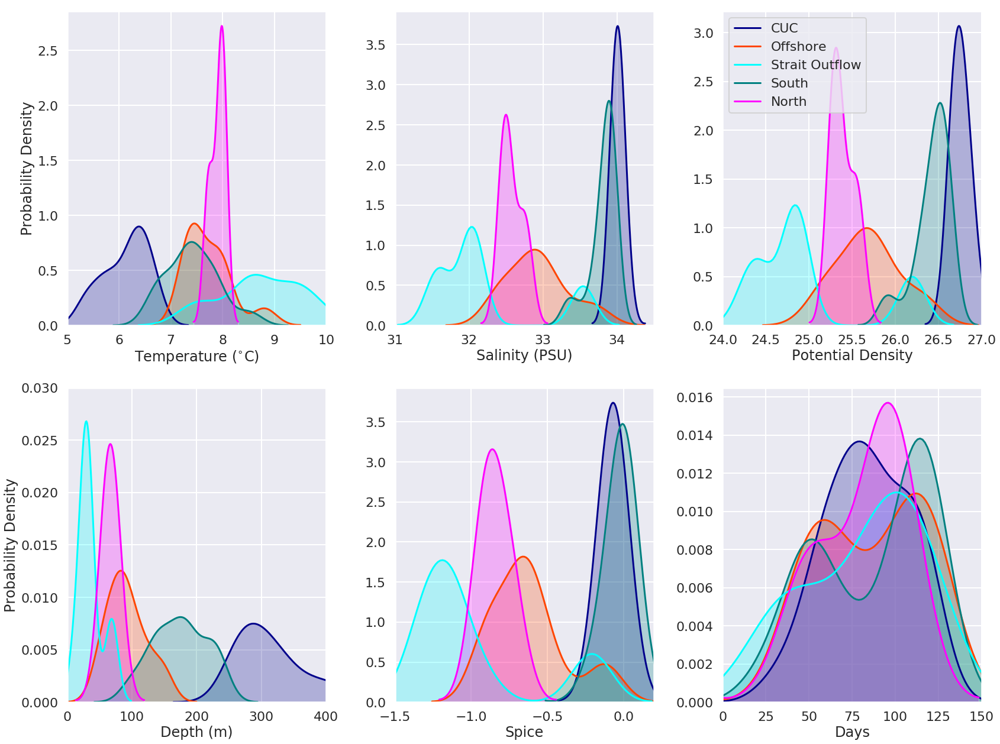

In [108]:
df = pd.DataFrame()

df['Density CUC']     = traj_rho_final_cuc
df['Temperature CUC'] = traj_tem_final_cuc
df['Salinity CUC']    = traj_sal_final_cuc
df['Spice CUC']       = spic_loc_cuc
df['Depth CUC']       = -traj_depth_final_cuc

dp = pd.DataFrame()

dp['Density OFF']     = traj_rho_final_off
dp['Temperature OFF'] = traj_tem_final_off
dp['Salinity OFF']    = traj_sal_final_off
dp['Spice OFF']       = spic_loc_off
dp['Depth OFF']       = -traj_depth_final_off

dg = pd.DataFrame()

dg['Density South']     = traj_rho_final_south
dg['Temperature South'] = traj_tem_final_south
dg['Salinity South']    = traj_sal_final_south
dg['Spice South']       = spic_loc_south
dg['Depth South']       = -traj_depth_final_south

dh = pd.DataFrame()

dh['Density Juan']     = traj_rho_final_juan
dh['Temperature Juan'] = traj_tem_final_juan
dh['Salinity Juan']    = traj_sal_final_juan
dh['Spice Juan']       = spic_loc_juan
dh['Depth Juan']       = -traj_depth_final_juan


dq = pd.DataFrame()

dq['Density North']     = traj_rho_final_north
dq['Temperature North'] = traj_tem_final_north
dq['Salinity North']    = traj_sal_final_north
dq['Spice North']       = spic_loc_north
dq['Depth North']       = -traj_depth_final_north


fig, (ax1,ax2) = plt.subplots(2,3, figsize=(24,18), sharey = False)

# g = df.plot.scatter(x="Observed temperature (deg C)", y="Corrected temperature (deg C)", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)

q = sns.kdeplot(df['Temperature CUC'], ax = ax1[0],shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Temperature OFF'], ax = ax1[0], shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Temperature Juan'], ax = ax1[0], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Temperature South'], ax = ax1[0], shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Temperature North'], ax = ax1[0], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]



# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[0].set_xlim(5,10)
ax1[0].set_xlabel('Temperature ($^{\circ}$C)')
ax1[0].set_ylabel('Probability Density')
ax1[0].get_legend().remove()
ax1[0].grid()


q = sns.kdeplot(df['Salinity CUC'], ax = ax1[1], bw=0.1,  shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Salinity OFF'], ax = ax1[1], shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Salinity Juan'], ax = ax1[1], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Salinity South'], ax = ax1[1],  bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Salinity North'], ax = ax1[1], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[1].set_xlim(31,34.5)
ax1[1].set_xlabel('Salinity (PSU)')
# ax2.set_ylabel('Density')
ax1[1].grid()
# ax1[2].legend()
ax1[1].get_legend().remove()


q = sns.kdeplot(df['Density CUC'], ax = ax1[2],bw=0.1, shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Density OFF'], ax = ax1[2], shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Density Juan'], ax = ax1[2], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Density South'], ax = ax1[2], bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Density North'], ax = ax1[2], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[2].set_xlim(24,27)
ax1[2].set_xlabel('Potential Density')
# ax2.set_ylabel('Density')
ax1[2].grid()
ax1[2].legend()
# ax1[2].get_legend().remove()


q = sns.kdeplot(df['Depth CUC'], ax = ax2[0], shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Depth OFF'], ax = ax2[0], shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Depth South'], ax = ax2[0], shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Depth Juan'], ax = ax2[0], bw=10, shade=True, color = 'Cyan', label = 'Staright Outflow')

sns.kdeplot(dq['Depth North'], ax = ax2[0], bw=15, shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]


# ax2[0].legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[0].set_xlabel('Depth (m)')
ax2[0].set_ylabel('Probability Density')
ax2[0].grid()

ax2[0].set_xlim(0,400)
ax2[0].set_ylim(0,0.03)
ax2[0].get_legend().remove()


q = sns.kdeplot(df['Spice CUC'], ax = ax2[1], bw=0.1, shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Spice OFF'], ax = ax2[1], shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Spice Juan'], ax = ax2[1], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Spice South'], ax = ax2[1],  bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Spice North'], ax = ax2[1],  bw=0.1, shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax2[1].set_xlim(-1.5,0.2)
ax2[1].set_xlabel('Spice')
# ax2.set_ylabel('Density')
ax2[1].grid()
ax2[1].get_legend().remove()

fig.tight_layout()


# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# plt.savefig(path_to_save+'fit_temp.png')



df = pd.DataFrame()

df['Days CUC']     = traj_days_final_cuc


dp = pd.DataFrame()

dp['Days OFF']     = traj_days_final_off


dg = pd.DataFrame()

dg['Days South']     = traj_days_final_south


dh = pd.DataFrame()

dh['Days Juan']     = traj_days_final_juan

dz = pd.DataFrame()

dz['Days North']    = traj_days_final_north




q = sns.kdeplot(df['Days CUC'], ax = ax2[2], shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Days OFF'], ax = ax2[2], shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Days South'], ax = ax2[2], shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Days Juan'], ax = ax2[2], shade=True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dz['Days North'], ax = ax2[2], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 



# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[2].set_xlabel('Days')
# ax1.set_ylabel('Probability Density')
ax2[2].grid()
ax2[2].get_legend().remove()

ax2[2].set_xlim(0,150)
fig.tight_layout()


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


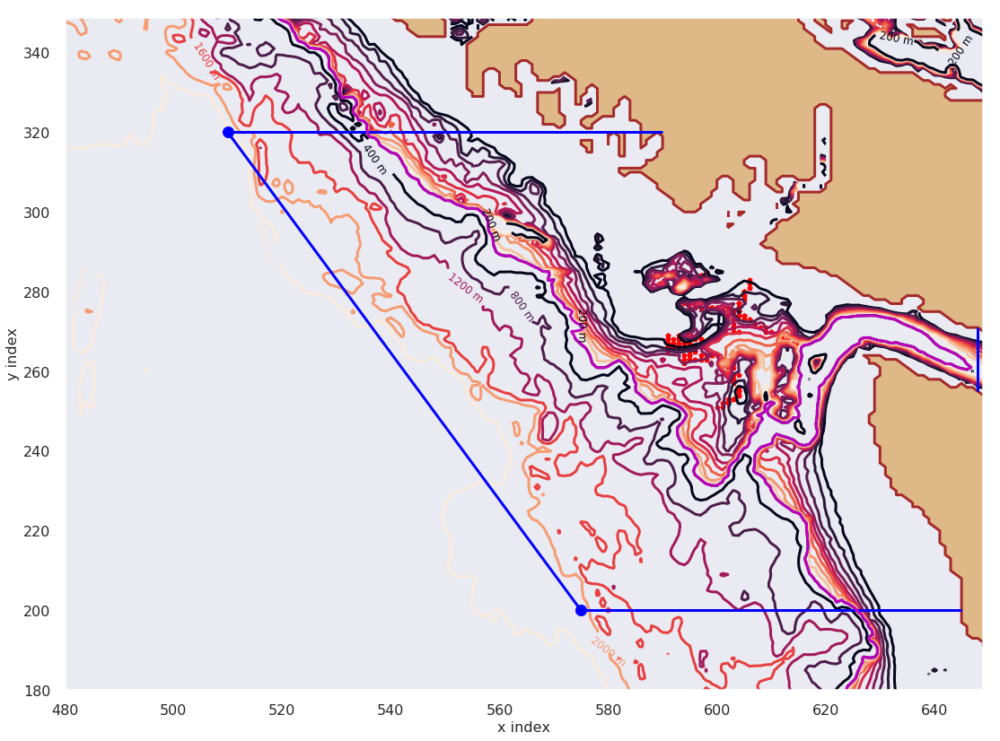

In [43]:



bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]




cmap=plt.cm.get_cmap('nipy_spectral')
#     cmap = plt.cm.get_cmap('gist_rainbow')
cmap.set_bad('#8b7765')
cmin = 0
cmax = 300

import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))

CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
contour = CS.collections[0]
vs = contour.get_paths()[0].vertices


vert = CS.collections[0].get_paths()[0].vertices

x_200_wcvi = vert[:,0]
y_200_wcvi = vert[:,1]

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)





ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

x = [510,575]
y = [320,200]
ax.plot(x, y , 'bo-')



# for simplex in hull_barkley.simplices:
#     plt.plot(points[simplex, 0], points[simplex, 1])



# ax.plot(x_b, y_b , 'yo-')

# xmin = x_wcvi_slice[np.int(np.min(np.unique(x1)))]-1
# xmax = x_wcvi_slice[np.int(np.max(np.unique(x1)))]-1


# ymin = y_wcvi_slice[np.int(np.min(np.unique(y1)))]-1
# ymax  = y_wcvi_slice[np.int(np.max(np.unique(y1)))]-1


# x_1 = [xmin, xmax]
# y_1 = [ymin, ymin]
# ax.plot(x_1, y_1 , 'go-')

# x_2 = [xmin, xmax]
# y_2 = [ymax, ymax]
# ax.plot(x_2, y_2 , 'go-')

# x_3 = [xmin, xmin]
# y_3 = [ymin, ymax]
# ax.plot(x_3, y_3 , 'go-')

# x_4 = [xmax, xmax]
# y_4 = [ymin, ymax]
# ax.plot(x_4, y_4 , 'go-')

ax.vlines(x = 648, ymin = 255, ymax = 271, color = 'blue')

# # ax.get_legend().remove()
# lon_LB08 = -125.4775
# lat_LB08 = 48.4217

# j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
#                                           lon,lat,grid='NEMO',tols=\
#                                           {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
#                                            'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

# ax.scatter(i,j, marker = 'o', c = 'red', s = 300, linewidths=100, label = 'Eddy region')


for k in np.arange(x1.shape[0]):
    ax.scatter(x_wcvi_slice[np.int(x1[k]-1)],y_wcvi_slice[np.int(y1[k]-1)], marker = '*', c = 'red', s = 10, linewidths=3)

ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
ax.hlines(y = 320, xmin = 510, xmax=590, color = 'b')
ax.grid()


# for i in range(0, len(x_200_wcvi), 10):
#     plt.plot(x_200_wcvi[i:i+1], y_200_wcvi[i:i+1], 'mo-')
    

Line = ax.plot(x_200_wcvi[::1], y_200_wcvi[::1], 'm-')
fig.tight_layout()





In [38]:
CS

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


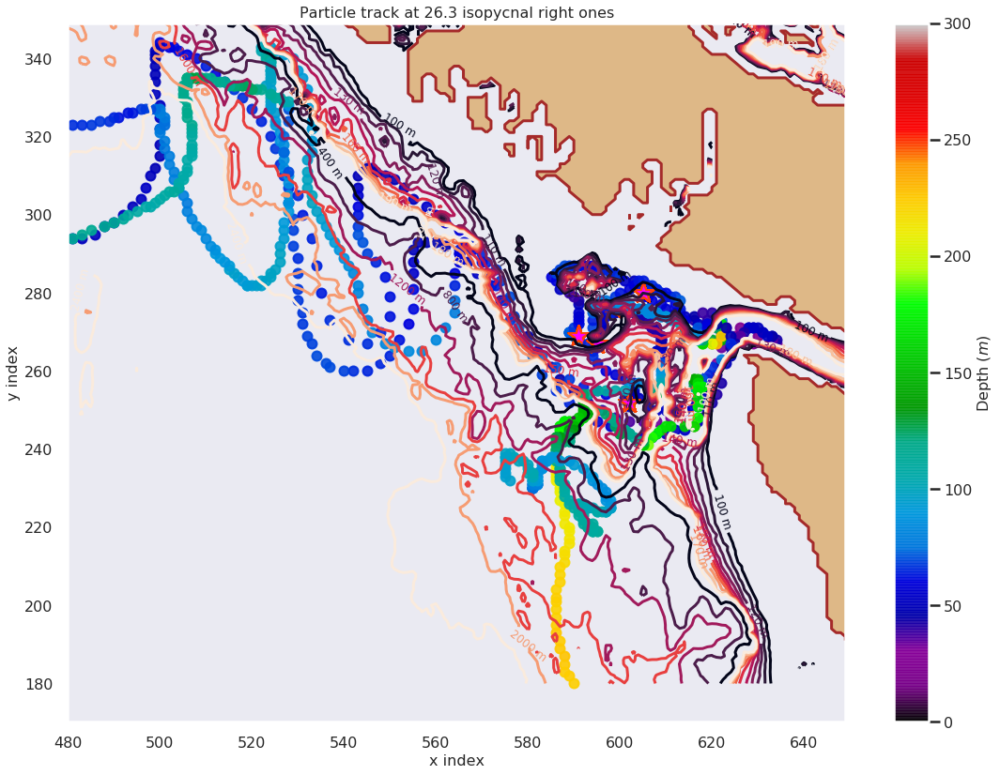

In [20]:


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



file_model = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d_20130429_20131025_grid_T_20130429-20130508.nc')

lon_small = file_model.variables['nav_lon'][1:,1:]
lat_small = file_model.variables['nav_lat'][1:,1:]




cmap=plt.cm.get_cmap('nipy_spectral')
#     cmap = plt.cm.get_cmap('gist_rainbow')
cmap.set_bad('#8b7765')
cmin = 0
cmax = 300

import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


# part = ind[0]
# for part in ind[139]:

for part in np.arange(0,final_age_days.shape[0],50):
    for k in np.arange(0,np.int(final_age_days[part]),10):
        y, x = geo_tools.find_closest_model_point(traj_lon[k,part],traj_lat[k,part],\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
        track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[part]))-1], y_wcvi_slice[np.int(np.rint(y1[part]))-1], s=500, marker = '*', c = 'magenta', alpha=0.9, edgecolor= 'orangered')
        q = ax.scatter(x, y, c = np.multiply(-1,np.ma.array(traj_depth[k,part]).filled()), cmap = cmap, vmin = cmin, vmax= cmax, s=100, alpha=0.9)#, edgecolor= 'cyan')

        t = np.int(np.rint(120 - traj_time[k,part]*120))
        level = np.int(np.rint((np.abs(zlevels - (-traj_depth[k,part]))).argmin()))



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


ax.set_title('Particle track at 26.3 isopycnal right ones', fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

ax.grid()

cbar = fig.colorbar(q, ax=ax)
cbar.set_label(label='Depth ($m$)', fontsize = 16)
cbar.ax.tick_params(labelsize=16)
fig.tight_layout()





### For the wrong particles predicted by model on the 26.3

In [2]:
zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]
y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


# nc_file = nc.Dataset('/data/ssahu/ARIANE/LB_08/LB_08_big_box.nc')

nc_file = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/isopyncal_263/wrong_traj.nc')
nc_tools.show_variables(nc_file)

odict_keys(['init_x', 'init_y', 'init_z', 'init_t', 'init_age', 'init_transp', 'final_x', 'final_y', 'final_z', 'final_t', 'final_age', 'final_transp', 'traj_lon', 'traj_lat', 'traj_depth', 'traj_time', 'traj_temp', 'traj_salt', 'traj_dens'])


In [4]:


init_x = nc_file.variables['init_x']
init_z = nc_file.variables['init_z']
init_age = nc_file.variables['init_age']

traj_depth = nc_file.variables['traj_depth'][:]
traj_lon   = nc_file.variables['traj_lon'][:]
traj_lat   = nc_file.variables['traj_lat'][:]
traj_rho   = nc_file.variables['traj_dens'][:]
traj_tem   = nc_file.variables['traj_temp'][:]
traj_sal   = nc_file.variables['traj_salt'][:]
traj_time  = nc_file.variables['traj_time']


final_age = nc_file.variables['final_age']


# lon1=nc_file.variables['traj_lon'][:]
# lat1=nc_file.variables['traj_lat'][:]
# dep1=nc_file.variables['traj_depth'][:]
x1=nc_file.variables['init_x'][:]
y1=nc_file.variables['init_y'][:]
t1=nc_file.variables['traj_time'][:]

x2=nc_file.variables['final_x'][:]
y2=nc_file.variables['final_y'][:]


final_z = nc_file.variables['final_z'][:]

final_age_days = final_age[:]/(3600)

/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:10: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:12: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type


In [5]:
x_final = []
y_final = []


for i in np.arange(x2.shape[0]):
    x_final = np.append(arr=x_final,values=x_wcvi_slice[np.int(np.rint(x2[i]))-1])
    y_final = np.append(arr=y_final,values=y_wcvi_slice[np.int(np.rint(y2[i]))-1])

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


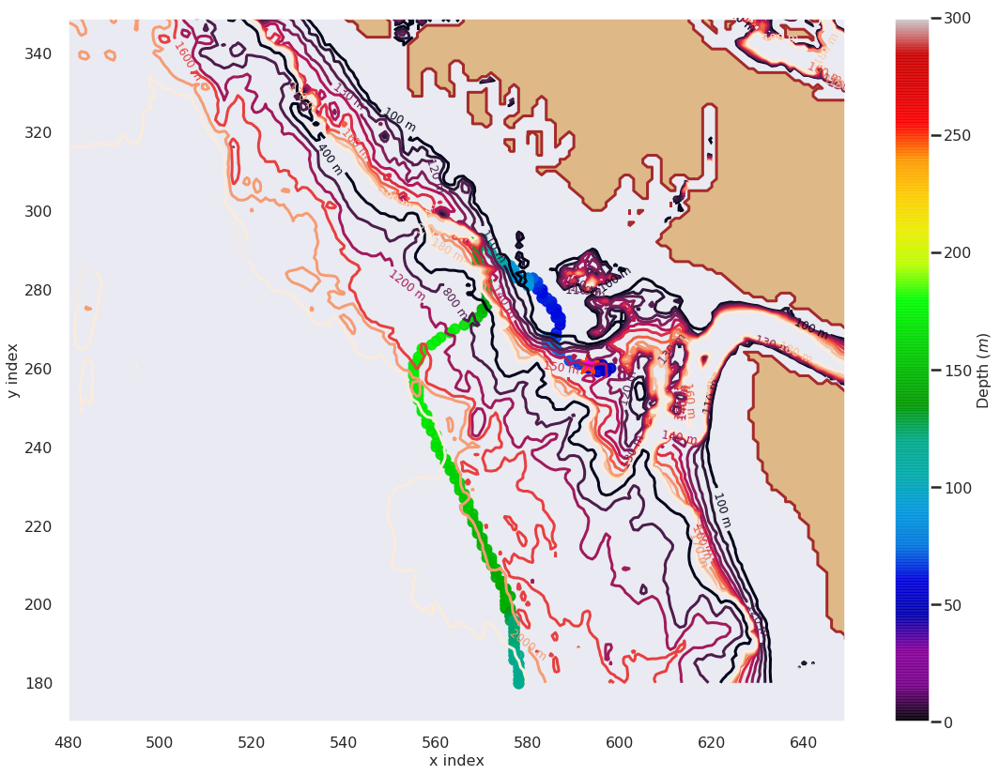

In [6]:
plot_particle_track(particle_ind=0)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


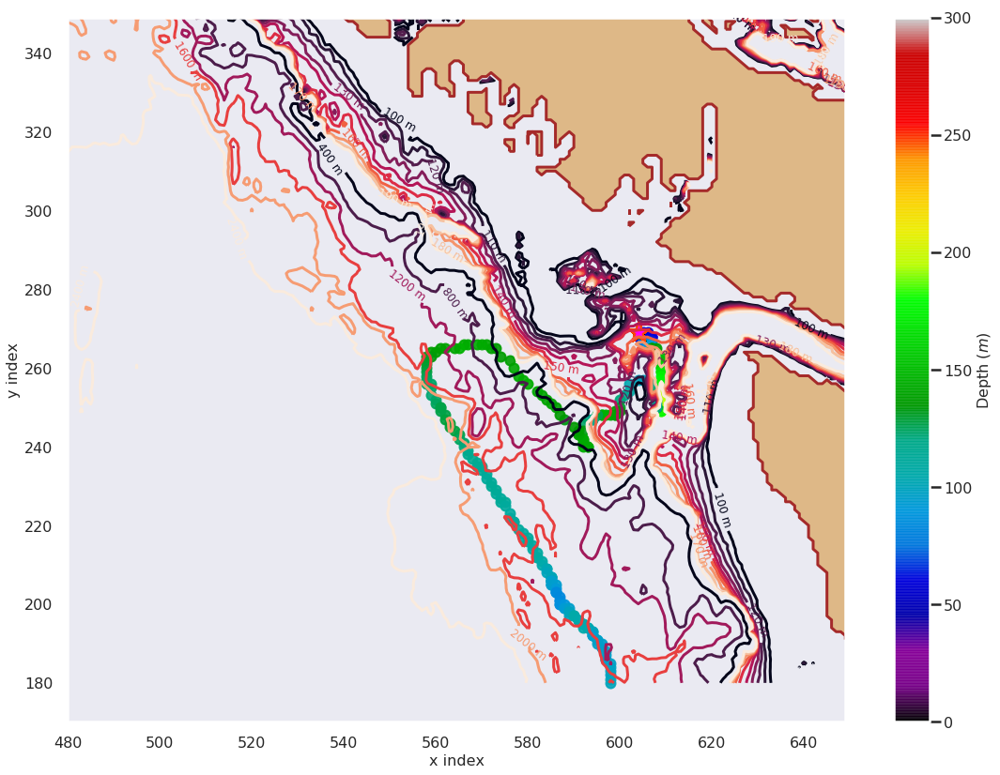

In [7]:
plot_particle_track(particle_ind=49)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


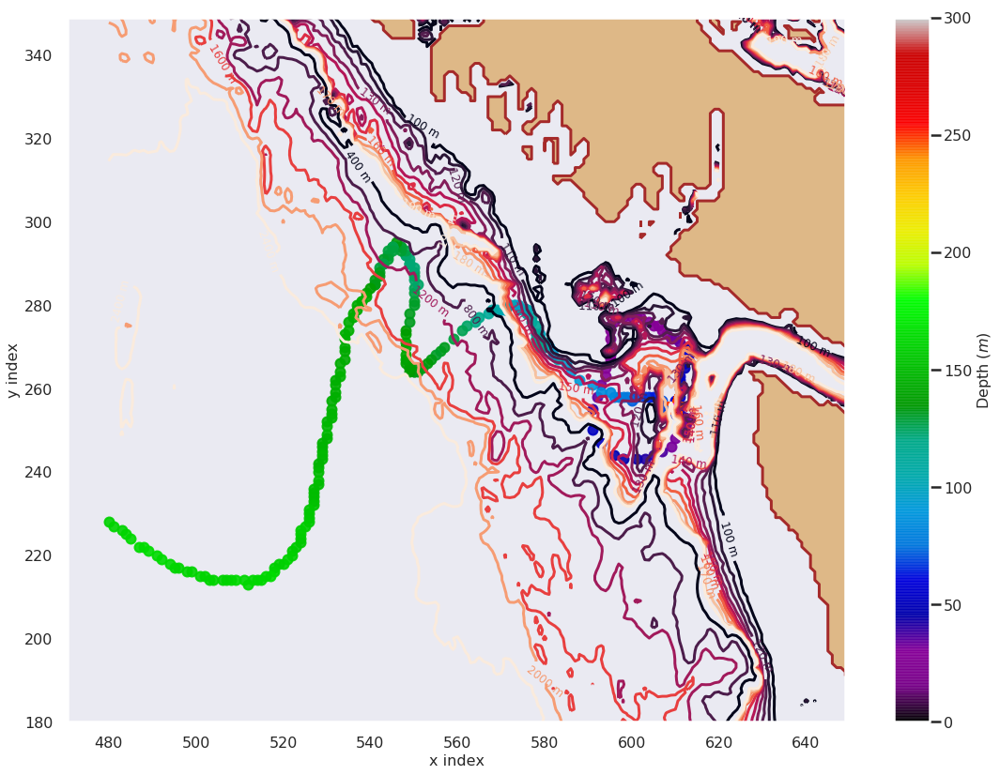

In [8]:
plot_particle_track(particle_ind=99)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


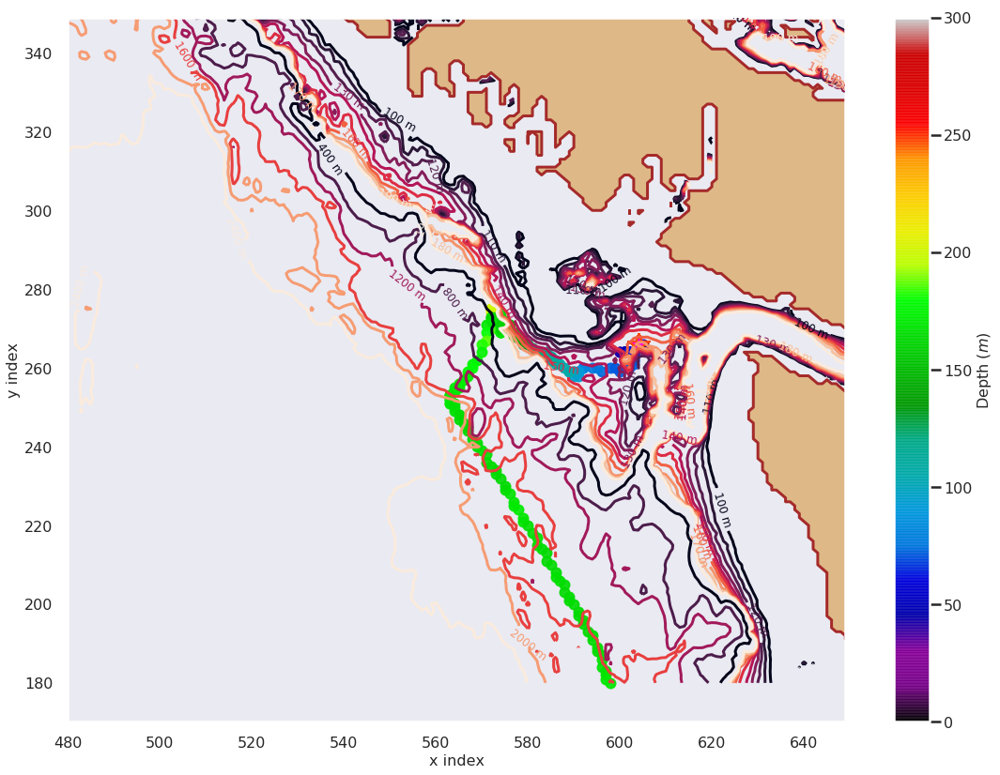

In [9]:
plot_particle_track(particle_ind=149)

In [5]:
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

p1= (x[0],y[0])
p1 = np.asarray(p1)
p2 = (x[1], y[1])
p2 = np.asarray(p2)



d = np.empty_like(x_final)

off_ind = []


for r in np.arange(x_final.shape[0]):

    p3 = (x_final[r], y_final[r])
    p3 = np.asarray(p3)
    d[r] =np.cross(p2-p1,p3-p1)/np.linalg.norm(p2-p1)
    
    if ((d[r] < 0) & (x_final[r] < 575)):
        off_ind = np.append(arr=off_ind, values=np.int(r))

In [14]:
num_north = np.round(a=final_age[(x_final < 580) & (y_final > 300)].shape[0]/final_z.shape[0], decimals=3)

north_percent = 100*num_north

print(north_percent)

num_cuc = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0].shape[0]/final_z.shape[0], decimals = 3)

cuc_percent = 100*num_cuc

print(cuc_percent)

num_south = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0].shape[0]/final_z.shape[0], decimals = 3)

south_percent = 100*num_south

print(south_percent)

### Bigger box
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))



# num = np.where((y_final[x_final_off] < y_final_off))[0].shape[0] + np.where((x_final<x_final_off[0]) & \
#                                                                       ((y_final > 200)&(y_final<320)))[0].shape[0]

# num_off = num/final_z.shape[0]
num_off = off_ind.shape[0]/final_z.shape[0]
off_percent = np.round(a=100*num_off, decimals=1)

print(off_percent)

num_juan = np.round(a=np.where((x_final > 635))[0].shape[0]/final_z.shape[0], decimals=3)

juan_percent = num_juan*100

print(juan_percent)

9.1
22.5
27.8
12.0
7.2


For particles wrongly predicted by model on 26.3 isopycncal


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/figure.py:1743: UserWarning: This figure includes Axes that are not compatible with tight_layout, so its results might be incorrect.
  warnings.warn("This figure includes Axes that are not "


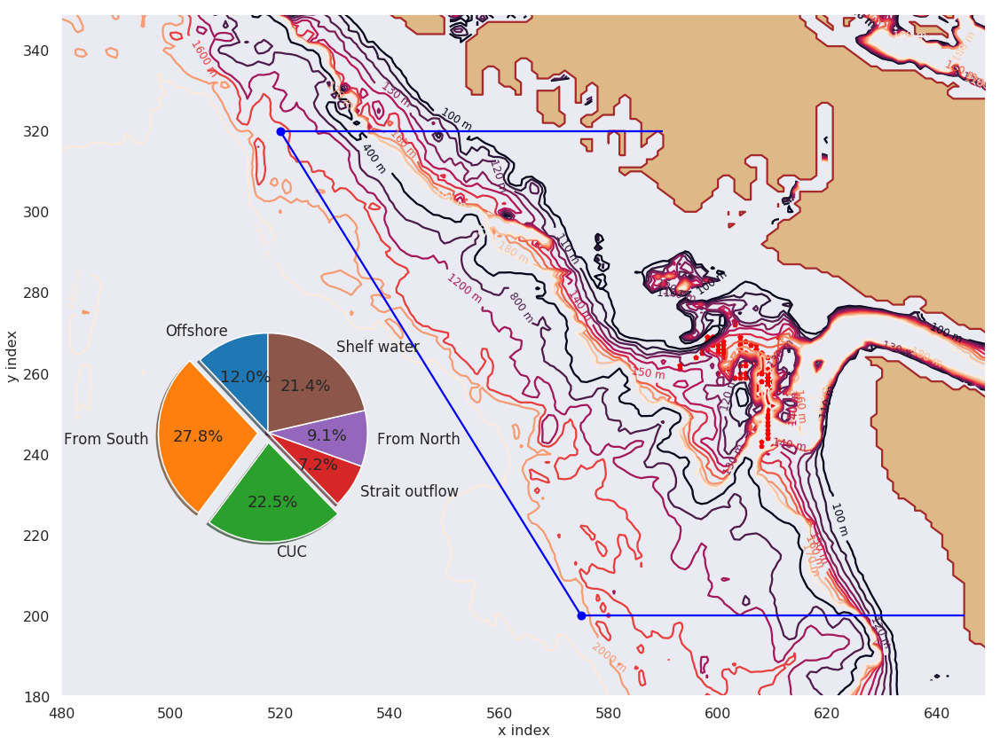

In [16]:
print("For particles wrongly predicted by model on 26.3 isopycncal")


plot_pie_diagram(cuc_percentage=cuc_percent, juan_percentage=juan_percent, \
                 north_percentage=north_percent, south_percentage=south_percent, \
                 off_percentage=off_percent)

In [17]:
traj_tem_last   = np.empty_like(final_age_days)
traj_sal_last   = np.empty_like(final_age_days)
traj_rho_last   = np.empty_like(final_age_days)
traj_depth_last = np.empty_like(final_age_days)


for r in np.arange(traj_tem_last.shape[0]):
    traj_tem_last[r]  =  traj_tem[np.int(final_age_days[r]),r]
    traj_sal_last[r]  =  traj_sal[np.int(final_age_days[r]),r]
    traj_rho_last[r]  =  traj_rho[np.int(final_age_days[r]),r]
    traj_depth_last[r] = traj_depth[np.int(final_age_days[r]),r]
    

In [19]:
traj_tem_final_cuc = traj_tem_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_sal_final_cuc = traj_sal_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_rho_final_cuc = traj_rho_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]


traj_depth_final_cuc = traj_depth_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_days_final_cuc = final_age_days[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]/24

traj_tem_final_cuc = traj_tem_final_cuc[~(traj_tem_final_cuc == 1.0000000200408773e+20)]

traj_sal_final_cuc = traj_sal_final_cuc[~(traj_sal_final_cuc == 1.0000000200408773e+20)]

traj_depth_final_cuc  = traj_depth_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]
traj_days_final_cuc   = traj_days_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]
traj_rho_final_cuc    = traj_rho_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]



traj_tem_final_north = traj_tem_last[((x_final < 580) & (y_final > 320))]
traj_tem_final_north = traj_tem_final_north[~(traj_tem_final_north == 1.0000000200408773e+20)]

traj_sal_final_north = traj_sal_last[((x_final < 580) & (y_final > 320))]
traj_sal_final_north = traj_sal_final_north[~(traj_sal_final_north == 1.0000000200408773e+20)]

traj_rho_final_north = traj_rho_last[((x_final < 580) & (y_final > 320))]
traj_depth_final_north = traj_depth_last[((x_final < 580) & (y_final > 320))]
traj_days_final_north  = final_age_days[((x_final < 580) & (y_final > 320))]/24

traj_depth_final_north  = traj_depth_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]
traj_days_final_north   = traj_days_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]
traj_rho_final_north = traj_rho_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]



traj_tem_final_south = traj_tem_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_sal_final_south = traj_sal_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_rho_final_south = traj_rho_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_depth_final_south = traj_depth_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]
traj_days_final_south  = final_age_days[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]/24


traj_tem_final_south = traj_tem_final_south[~(traj_tem_final_south == 1.0000000200408773e+20)]

traj_sal_final_south = traj_sal_final_south[~(traj_sal_final_south == 1.0000000200408773e+20)]


traj_depth_final_south = traj_depth_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]
traj_days_final_south  = traj_days_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]
traj_rho_final_south = traj_rho_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]


traj_tem_final_juan = traj_tem_last[(x_final > 648)]
traj_tem_final_juan = traj_tem_final_juan[~(traj_tem_final_juan == 1.0000000200408773e+20)]

traj_sal_final_juan = traj_sal_last[(x_final > 648)]
traj_sal_final_juan = traj_sal_final_juan[~(traj_sal_final_juan == 1.0000000200408773e+20)]

traj_rho_final_juan = traj_rho_last[(x_final > 648)]

traj_depth_final_juan = traj_depth_last[(x_final > 648)]
traj_days_final_juan = final_age_days[(x_final > 648)]/24

traj_depth_final_juan = traj_depth_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]
traj_days_final_juan  = traj_days_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]
traj_rho_final_juan = traj_rho_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]



x = [510,575]
y = [320,200]

coefficients = np.polyfit(x, y, 1)
x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

# num = np.where((y_final[x_final_off] < y_final_off))[0].shape[0] + np.where((x_final<x_final_off[0]) & \
#                                                                       ((y_final > 200)&(y_final<320)))[0].shape[0]

traj_tem_final_off = []
# traj_tem_final_off = np.append(arr=traj_tem_final_off, \
#                                values= traj_tem_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_tem_final_off = np.append(arr=traj_tem_final_off, \
#                                values = traj_tem_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
# traj_tem_final_off = traj_tem_final_off[~(traj_tem_final_off == 1.0000000200408773e+20)]

traj_sal_final_off = []
# traj_sal_final_off = np.append(arr=traj_sal_final_off, \
#                                values= traj_sal_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_sal_final_off = np.append(arr=traj_sal_final_off, \
#                                values = traj_sal_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
# traj_sal_final_off = traj_sal_final_off[~(traj_sal_final_off == 1.0000000200408773e+20)]


traj_rho_final_off = []

# traj_rho_final_off = np.append(arr=traj_rho_final_off, \
#                                values= traj_rho_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_rho_final_off = np.append(arr=traj_rho_final_off, \
#                                values = traj_rho_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])


# traj_depth_final_off = []
# traj_depth_final_off = np.append(arr=traj_depth_final_off, \
#                                values= traj_depth_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_depth_final_off = np.append(arr=traj_depth_final_off, \
#                                values = traj_depth_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
traj_depth_final_off = []
traj_days_final_off = []

for l in np.arange(off_ind.shape[0]):

    traj_depth_final_off = np.append(arr=traj_depth_final_off, values=traj_depth_last[np.int(off_ind[l])])
    traj_days_final_off = np.append(arr=traj_days_final_off, values=final_age_days[np.int(off_ind[l])]/24)
    traj_rho_final_off   = np.append(arr=traj_rho_final_off, values=traj_rho_last[np.int(off_ind[l])])
    traj_tem_final_off   = np.append(arr=traj_tem_final_off, values=traj_tem_last[np.int(off_ind[l])])
    traj_sal_final_off   = np.append(arr=traj_sal_final_off, values=traj_sal_last[np.int(off_ind[l])])


traj_depth_final_off = traj_depth_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]
traj_days_final_off  = traj_days_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]
traj_rho_final_off = traj_rho_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]

In [20]:
pressure_loc_cuc = np.empty_like(traj_depth_final_cuc)
SA_loc_cuc       = np.empty_like(traj_depth_final_cuc)
CT_loc_cuc       = np.empty_like(traj_depth_final_cuc)
spic_loc_cuc     = np.empty_like(traj_depth_final_cuc)



for i in np.arange(traj_depth_final_cuc.shape[0]):
    
    pressure_loc_cuc[i] = gsw.p_from_z(traj_depth_final_cuc[i],np.mean(traj_lat))
    
    SA_loc_cuc[i] = gsw.SA_from_SP(traj_sal_final_cuc[i], pressure_loc_cuc[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_cuc[i] = gsw.CT_from_pt(traj_sal_final_cuc[i], traj_tem_final_cuc[i])
    
    spic_loc_cuc[i] = gsw.spiciness0(SA_loc_cuc[i], CT_loc_cuc[i])
    
pressure_loc_off = np.empty_like(traj_depth_final_off)
SA_loc_off       = np.empty_like(traj_depth_final_off)
CT_loc_off       = np.empty_like(traj_depth_final_off)
spic_loc_off     = np.empty_like(traj_depth_final_off)



for i in np.arange(traj_depth_final_off.shape[0]):
    
    pressure_loc_off[i] = gsw.p_from_z(traj_depth_final_off[i],np.mean(traj_lat))
    
    SA_loc_off[i] = gsw.SA_from_SP(traj_sal_final_off[i], pressure_loc_off[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_off[i] = gsw.CT_from_pt(traj_sal_final_off[i], traj_tem_final_off[i])
    
    spic_loc_off[i] = gsw.spiciness0(SA_loc_off[i], CT_loc_off[i])
    
pressure_loc_south = np.empty_like(traj_depth_final_south)
SA_loc_south       = np.empty_like(traj_depth_final_south)
CT_loc_south       = np.empty_like(traj_depth_final_south)
spic_loc_south     = np.empty_like(traj_depth_final_south)



for i in np.arange(traj_depth_final_south.shape[0]):
    
    pressure_loc_south[i] = gsw.p_from_z(traj_depth_final_south[i],np.mean(traj_lat))
    
    SA_loc_south[i] = gsw.SA_from_SP(traj_sal_final_south[i], pressure_loc_south[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_south[i] = gsw.CT_from_pt(traj_sal_final_south[i], traj_tem_final_south[i])
    
    spic_loc_south[i] = gsw.spiciness0(SA_loc_south[i], CT_loc_south[i])
    
pressure_loc_north= np.empty_like(traj_depth_final_north)
SA_loc_north       = np.empty_like(traj_depth_final_north)
CT_loc_north       = np.empty_like(traj_depth_final_north)
spic_loc_north     = np.empty_like(traj_depth_final_north)



for i in np.arange(traj_depth_final_north.shape[0]):
    
    pressure_loc_north[i] = gsw.p_from_z(traj_depth_final_north[i],np.mean(traj_lat))
    
    SA_loc_north[i] = gsw.SA_from_SP(traj_sal_final_north[i], pressure_loc_north[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_north[i] = gsw.CT_from_pt(traj_sal_final_north[i], traj_tem_final_north[i])
    
    spic_loc_north[i] = gsw.spiciness0(SA_loc_north[i], CT_loc_north[i])
    

pressure_loc_juan= np.empty_like(traj_depth_final_juan)
SA_loc_juan       = np.empty_like(traj_depth_final_juan)
CT_loc_juan       = np.empty_like(traj_depth_final_juan)
spic_loc_juan     = np.empty_like(traj_depth_final_juan)



for i in np.arange(traj_depth_final_juan.shape[0]):
    
    pressure_loc_juan[i] = gsw.p_from_z(traj_depth_final_juan[i],np.mean(traj_lat))
    
    SA_loc_juan[i] = gsw.SA_from_SP(traj_sal_final_juan[i], pressure_loc_juan[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_juan[i] = gsw.CT_from_pt(traj_sal_final_juan[i], traj_tem_final_juan[i])
    
    spic_loc_juan[i] = gsw.spiciness0(SA_loc_juan[i], CT_loc_juan[i])
    

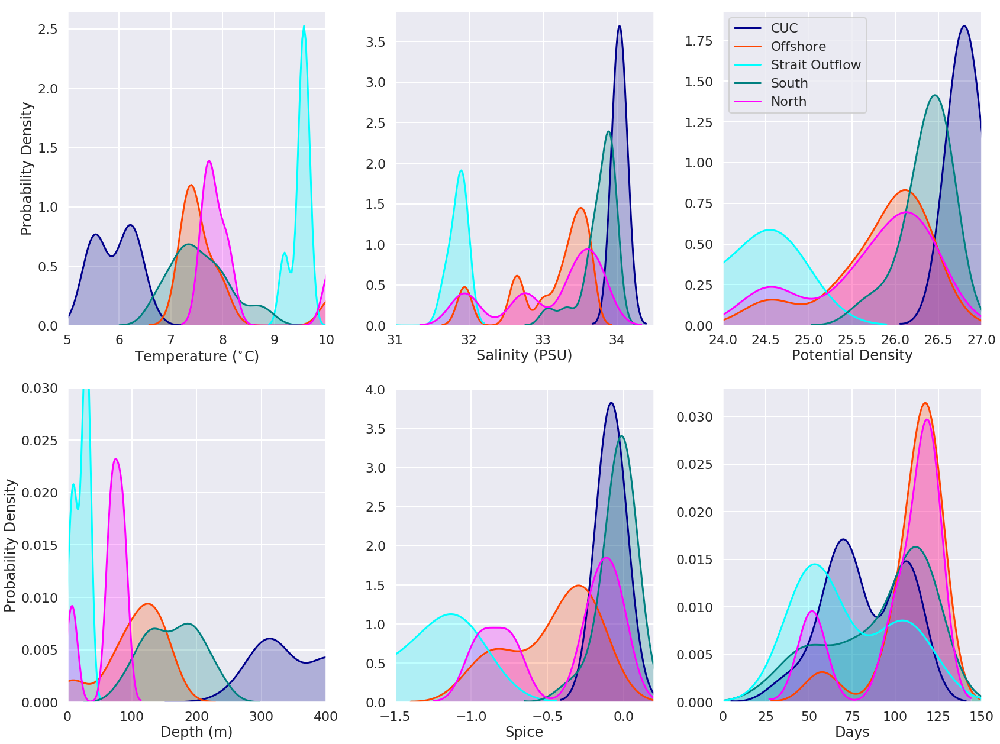

In [34]:
df = pd.DataFrame()

df['Density CUC']     = traj_rho_final_cuc
df['Temperature CUC'] = traj_tem_final_cuc
df['Salinity CUC']    = traj_sal_final_cuc
df['Spice CUC']       = spic_loc_cuc
df['Depth CUC']       = -traj_depth_final_cuc

dp = pd.DataFrame()

dp['Density OFF']     = traj_rho_final_off
dp['Temperature OFF'] = traj_tem_final_off
dp['Salinity OFF']    = traj_sal_final_off
dp['Spice OFF']       = spic_loc_off
dp['Depth OFF']       = -traj_depth_final_off

dg = pd.DataFrame()

dg['Density South']     = traj_rho_final_south
dg['Temperature South'] = traj_tem_final_south
dg['Salinity South']    = traj_sal_final_south
dg['Spice South']       = spic_loc_south
dg['Depth South']       = -traj_depth_final_south

dh = pd.DataFrame()

dh['Density Juan']     = traj_rho_final_juan
dh['Temperature Juan'] = traj_tem_final_juan
dh['Salinity Juan']    = traj_sal_final_juan
dh['Spice Juan']       = spic_loc_juan
dh['Depth Juan']       = -traj_depth_final_juan


dq = pd.DataFrame()

dq['Density North']     = traj_rho_final_north
dq['Temperature North'] = traj_tem_final_north
dq['Salinity North']    = traj_sal_final_north
dq['Spice North']       = spic_loc_north
dq['Depth North']       = -traj_depth_final_north


fig, (ax1,ax2) = plt.subplots(2,3, figsize=(24,18), sharey = False)

# g = df.plot.scatter(x="Observed temperature (deg C)", y="Corrected temperature (deg C)", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)

q = sns.kdeplot(df['Temperature CUC'], ax = ax1[0],shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Temperature OFF'], ax = ax1[0], shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Temperature Juan'], ax = ax1[0], bw=0.1, shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Temperature South'], ax = ax1[0], shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Temperature North'], ax = ax1[0], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]



# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[0].set_xlim(5,10)
ax1[0].set_xlabel('Temperature ($^{\circ}$C)')
ax1[0].set_ylabel('Probability Density')
ax1[0].get_legend().remove()
ax1[0].grid()


q = sns.kdeplot(df['Salinity CUC'], ax = ax1[1], bw=0.1,  shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Salinity OFF'], ax = ax1[1], bw = 0.1, shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Salinity Juan'], ax = ax1[1], bw = 0.1, shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Salinity South'], ax = ax1[1],  bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Salinity North'], ax = ax1[1], bw = 0.2, shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[1].set_xlim(31,34.5)
ax1[1].set_xlabel('Salinity (PSU)')
# ax2.set_ylabel('Density')
ax1[1].grid()
# ax1[2].legend()
ax1[1].get_legend().remove()


q = sns.kdeplot(df['Density CUC'], ax = ax1[2],bw=0.2, shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Density OFF'], ax = ax1[2], shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Density Juan'], ax = ax1[2], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Density South'], ax = ax1[2], bw=0.2, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Density North'], ax = ax1[2], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[2].set_xlim(24,27)
ax1[2].set_xlabel('Potential Density')
# ax2.set_ylabel('Density')
ax1[2].grid()
ax1[2].legend()
# ax1[2].get_legend().remove()


q = sns.kdeplot(df['Depth CUC'], ax = ax2[0], shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Depth OFF'], ax = ax2[0], shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Depth South'], ax = ax2[0], shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Depth Juan'], ax = ax2[0],  shade=True, color = 'Cyan', label = 'Staright Outflow')

sns.kdeplot(dq['Depth North'], ax = ax2[0],  shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]


# ax2[0].legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[0].set_xlabel('Depth (m)')
ax2[0].set_ylabel('Probability Density')
ax2[0].grid()

ax2[0].set_xlim(0,400)
ax2[0].set_ylim(0,0.03)
ax2[0].get_legend().remove()


q = sns.kdeplot(df['Spice CUC'], ax = ax2[1], bw=0.1, shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Spice OFF'], ax = ax2[1], shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Spice Juan'], ax = ax2[1], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Spice South'], ax = ax2[1],  bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Spice North'], ax = ax2[1],  bw=0.1, shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax2[1].set_xlim(-1.5,0.2)
ax2[1].set_xlabel('Spice')
# ax2.set_ylabel('Density')
ax2[1].grid()
ax2[1].get_legend().remove()

fig.tight_layout()


# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# plt.savefig(path_to_save+'fit_temp.png')



df = pd.DataFrame()

df['Days CUC']     = traj_days_final_cuc


dp = pd.DataFrame()

dp['Days OFF']     = traj_days_final_off


dg = pd.DataFrame()

dg['Days South']     = traj_days_final_south


dh = pd.DataFrame()

dh['Days Juan']     = traj_days_final_juan

dz = pd.DataFrame()

dz['Days North']    = traj_days_final_north




q = sns.kdeplot(df['Days CUC'], ax = ax2[2], shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Days OFF'], ax = ax2[2], bw = 10, shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Days South'], ax = ax2[2], shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Days Juan'], ax = ax2[2], shade=True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dz['Days North'], ax = ax2[2],  shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 



# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[2].set_xlabel('Days')
# ax1.set_ylabel('Probability Density')
ax2[2].grid()
ax2[2].get_legend().remove()

ax2[2].set_xlim(0,150)
fig.tight_layout()


### offshore and north (spice, density) in wrong is a lot closer to the CUC (spice, density) as compared to right

## On the 26.4 isopycnal

In [8]:
zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]
y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


# nc_file = nc.Dataset('/data/ssahu/ARIANE/LB_08/LB_08_big_box.nc')

nc_file = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/isopyncal_264/right_traj.nc')
nc_tools.show_variables(nc_file)

odict_keys(['init_x', 'init_y', 'init_z', 'init_t', 'init_age', 'init_transp', 'final_x', 'final_y', 'final_z', 'final_t', 'final_age', 'final_transp', 'traj_lon', 'traj_lat', 'traj_depth', 'traj_time', 'traj_temp', 'traj_salt', 'traj_dens'])


In [9]:


init_x = nc_file.variables['init_x']
init_z = nc_file.variables['init_z']
init_age = nc_file.variables['init_age']

traj_depth = nc_file.variables['traj_depth'][:]
traj_lon   = nc_file.variables['traj_lon'][:]
traj_lat   = nc_file.variables['traj_lat'][:]
traj_rho   = nc_file.variables['traj_dens'][:]
traj_tem   = nc_file.variables['traj_temp'][:]
traj_sal   = nc_file.variables['traj_salt'][:]
traj_time  = nc_file.variables['traj_time']


final_age = nc_file.variables['final_age']


# lon1=nc_file.variables['traj_lon'][:]
# lat1=nc_file.variables['traj_lat'][:]
# dep1=nc_file.variables['traj_depth'][:]
x1=nc_file.variables['init_x'][:]
y1=nc_file.variables['init_y'][:]
t1=nc_file.variables['traj_time'][:]

x2=nc_file.variables['final_x'][:]
y2=nc_file.variables['final_y'][:]


final_z = nc_file.variables['final_z'][:]

final_age_days = final_age[:]/(3600)

/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:10: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:12: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type


In [10]:
x_final = []
y_final = []


for i in np.arange(x2.shape[0]):
    x_final = np.append(arr=x_final,values=x_wcvi_slice[np.int(np.rint(x2[i]))-1])
    y_final = np.append(arr=y_final,values=y_wcvi_slice[np.int(np.rint(y2[i]))-1])

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


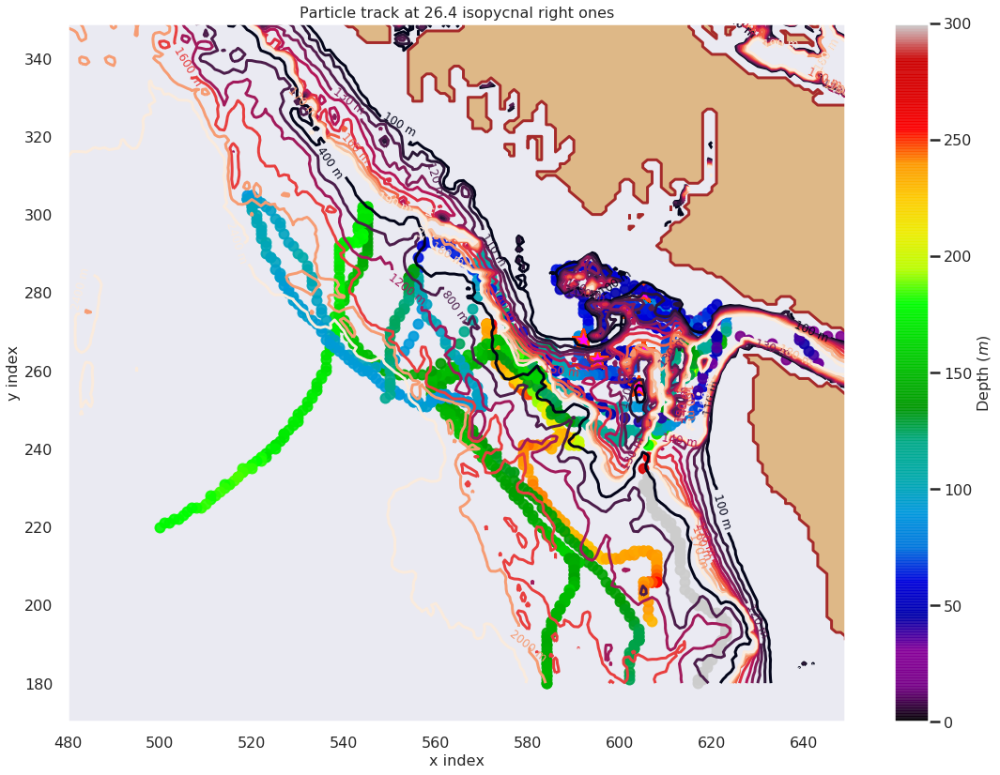

In [11]:


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



file_model = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d_20130429_20131025_grid_T_20130429-20130508.nc')

lon_small = file_model.variables['nav_lon'][1:,1:]
lat_small = file_model.variables['nav_lat'][1:,1:]




cmap=plt.cm.get_cmap('nipy_spectral')
#     cmap = plt.cm.get_cmap('gist_rainbow')
cmap.set_bad('#8b7765')
cmin = 0
cmax = 300

import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


# part = ind[0]
# for part in ind[139]:

for part in np.arange(0,final_age_days.shape[0],50):
    for k in np.arange(0,np.int(final_age_days[part]),10):
        y, x = geo_tools.find_closest_model_point(traj_lon[k,part],traj_lat[k,part],\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
        track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[part]))-1], y_wcvi_slice[np.int(np.rint(y1[part]))-1], s=500, marker = '*', c = 'magenta', alpha=0.9, edgecolor= 'orangered')
        q = ax.scatter(x, y, c = np.multiply(-1,np.ma.array(traj_depth[k,part]).filled()), cmap = cmap, vmin = cmin, vmax= cmax, s=100, alpha=0.9)#, edgecolor= 'cyan')

        t = np.int(np.rint(120 - traj_time[k,part]*120))
        level = np.int(np.rint((np.abs(zlevels - (-traj_depth[k,part]))).argmin()))



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


ax.set_title('Particle track at 26.4 isopycnal right ones', fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

ax.grid()

cbar = fig.colorbar(q, ax=ax)
cbar.set_label(label='Depth ($m$)', fontsize = 16)
cbar.ax.tick_params(labelsize=16)
fig.tight_layout()





In [25]:
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

p1= (x[0],y[0])
p1 = np.asarray(p1)
p2 = (x[1], y[1])
p2 = np.asarray(p2)



d = np.empty_like(x_final)

off_ind = []


for r in np.arange(x_final.shape[0]):

    p3 = (x_final[r], y_final[r])
    p3 = np.asarray(p3)
    d[r] =np.cross(p2-p1,p3-p1)/np.linalg.norm(p2-p1)
    
    if ((d[r] < 0) & (x_final[r] < 575)):
        off_ind = np.append(arr=off_ind, values=np.int(r))

In [8]:
num_north = np.round(a=final_age[(x_final < 580) & (y_final > 300)].shape[0]/final_z.shape[0], decimals=3)

north_percent = 100*num_north

print(north_percent)

num_cuc = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0].shape[0]/final_z.shape[0], decimals = 3)

cuc_percent = 100*num_cuc

print(cuc_percent)

num_south = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0].shape[0]/final_z.shape[0], decimals = 3)

south_percent = 100*num_south

print(south_percent)

### Bigger box
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))



# num = np.where((y_final[x_final_off] < y_final_off))[0].shape[0] + np.where((x_final<x_final_off[0]) & \
#                                                                       ((y_final > 200)&(y_final<320)))[0].shape[0]

# num_off = num/final_z.shape[0]
num_off = off_ind.shape[0]/final_z.shape[0]
off_percent = np.round(a=100*num_off, decimals=1)

print(off_percent)

num_juan = np.round(a=np.where((x_final > 635))[0].shape[0]/final_z.shape[0], decimals=3)

juan_percent = num_juan*100

print(juan_percent)

9.5
13.8
34.4
6.6
3.6


In [23]:
sns.set_context('talk')

For particles rightly predicted by model on 26.4 isopycncal


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/figure.py:1743: UserWarning: This figure includes Axes that are not compatible with tight_layout, so its results might be incorrect.
  warnings.warn("This figure includes Axes that are not "


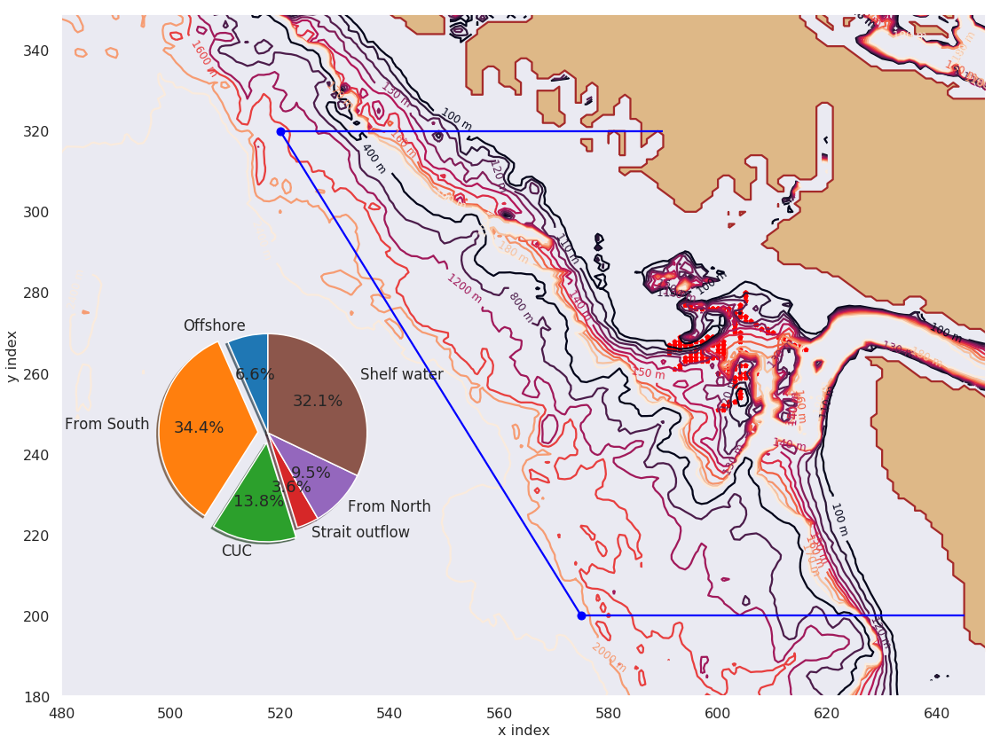

In [11]:
print("For particles rightly predicted by model on 26.4 isopycncal")


plot_pie_diagram(cuc_percentage=cuc_percent, juan_percentage=juan_percent, \
                 north_percentage=north_percent, south_percentage=south_percent, \
                 off_percentage=off_percent)

In [5]:
traj_tem_last   = np.empty_like(final_age_days)
traj_sal_last   = np.empty_like(final_age_days)
traj_rho_last   = np.empty_like(final_age_days)
traj_depth_last = np.empty_like(final_age_days)


for r in np.arange(traj_tem_last.shape[0]):
    traj_tem_last[r]  =  traj_tem[np.int(final_age_days[r]),r]
    traj_sal_last[r]  =  traj_sal[np.int(final_age_days[r]),r]
    traj_rho_last[r]  =  traj_rho[np.int(final_age_days[r]),r]
    traj_depth_last[r] = traj_depth[np.int(final_age_days[r]),r]
    

In [13]:
traj_tem_final_cuc = traj_tem_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_sal_final_cuc = traj_sal_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_rho_final_cuc = traj_rho_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]


traj_depth_final_cuc = traj_depth_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_days_final_cuc = final_age_days[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]/24

traj_tem_final_cuc = traj_tem_final_cuc[~(traj_tem_final_cuc == 1.0000000200408773e+20)]

traj_sal_final_cuc = traj_sal_final_cuc[~(traj_sal_final_cuc == 1.0000000200408773e+20)]

traj_depth_final_cuc  = traj_depth_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]
traj_days_final_cuc   = traj_days_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]
traj_rho_final_cuc    = traj_rho_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]



traj_tem_final_north = traj_tem_last[((x_final < 580) & (y_final > 320))]
traj_tem_final_north = traj_tem_final_north[~(traj_tem_final_north == 1.0000000200408773e+20)]

traj_sal_final_north = traj_sal_last[((x_final < 580) & (y_final > 320))]
traj_sal_final_north = traj_sal_final_north[~(traj_sal_final_north == 1.0000000200408773e+20)]

traj_rho_final_north = traj_rho_last[((x_final < 580) & (y_final > 320))]
traj_depth_final_north = traj_depth_last[((x_final < 580) & (y_final > 320))]
traj_days_final_north  = final_age_days[((x_final < 580) & (y_final > 320))]/24

traj_depth_final_north  = traj_depth_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]
traj_days_final_north   = traj_days_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]
traj_rho_final_north = traj_rho_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]



traj_tem_final_south = traj_tem_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_sal_final_south = traj_sal_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_rho_final_south = traj_rho_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_depth_final_south = traj_depth_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]
traj_days_final_south  = final_age_days[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]/24


traj_tem_final_south = traj_tem_final_south[~(traj_tem_final_south == 1.0000000200408773e+20)]

traj_sal_final_south = traj_sal_final_south[~(traj_sal_final_south == 1.0000000200408773e+20)]


traj_depth_final_south = traj_depth_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]
traj_days_final_south  = traj_days_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]
traj_rho_final_south = traj_rho_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]


traj_tem_final_juan = traj_tem_last[(x_final > 648)]
traj_tem_final_juan = traj_tem_final_juan[~(traj_tem_final_juan == 1.0000000200408773e+20)]

traj_sal_final_juan = traj_sal_last[(x_final > 648)]
traj_sal_final_juan = traj_sal_final_juan[~(traj_sal_final_juan == 1.0000000200408773e+20)]

traj_rho_final_juan = traj_rho_last[(x_final > 648)]

traj_depth_final_juan = traj_depth_last[(x_final > 648)]
traj_days_final_juan = final_age_days[(x_final > 648)]/24

traj_depth_final_juan = traj_depth_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]
traj_days_final_juan  = traj_days_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]
traj_rho_final_juan = traj_rho_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]



x = [510,575]
y = [320,200]

coefficients = np.polyfit(x, y, 1)
x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

# num = np.where((y_final[x_final_off] < y_final_off))[0].shape[0] + np.where((x_final<x_final_off[0]) & \
#                                                                       ((y_final > 200)&(y_final<320)))[0].shape[0]

traj_tem_final_off = []
# traj_tem_final_off = np.append(arr=traj_tem_final_off, \
#                                values= traj_tem_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_tem_final_off = np.append(arr=traj_tem_final_off, \
#                                values = traj_tem_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
# traj_tem_final_off = traj_tem_final_off[~(traj_tem_final_off == 1.0000000200408773e+20)]

traj_sal_final_off = []
# traj_sal_final_off = np.append(arr=traj_sal_final_off, \
#                                values= traj_sal_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_sal_final_off = np.append(arr=traj_sal_final_off, \
#                                values = traj_sal_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
# traj_sal_final_off = traj_sal_final_off[~(traj_sal_final_off == 1.0000000200408773e+20)]


traj_rho_final_off = []

# traj_rho_final_off = np.append(arr=traj_rho_final_off, \
#                                values= traj_rho_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_rho_final_off = np.append(arr=traj_rho_final_off, \
#                                values = traj_rho_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])


# traj_depth_final_off = []
# traj_depth_final_off = np.append(arr=traj_depth_final_off, \
#                                values= traj_depth_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_depth_final_off = np.append(arr=traj_depth_final_off, \
#                                values = traj_depth_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
traj_depth_final_off = []
traj_days_final_off = []

for l in np.arange(off_ind.shape[0]):

    traj_depth_final_off = np.append(arr=traj_depth_final_off, values=traj_depth_last[np.int(off_ind[l])])
    traj_days_final_off = np.append(arr=traj_days_final_off, values=final_age_days[np.int(off_ind[l])]/24)
    traj_rho_final_off   = np.append(arr=traj_rho_final_off, values=traj_rho_last[np.int(off_ind[l])])
    traj_tem_final_off   = np.append(arr=traj_tem_final_off, values=traj_tem_last[np.int(off_ind[l])])
    traj_sal_final_off   = np.append(arr=traj_sal_final_off, values=traj_sal_last[np.int(off_ind[l])])


traj_depth_final_off = traj_depth_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]
traj_days_final_off  = traj_days_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]
traj_rho_final_off = traj_rho_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]

In [14]:
pressure_loc_cuc = np.empty_like(traj_depth_final_cuc)
SA_loc_cuc       = np.empty_like(traj_depth_final_cuc)
CT_loc_cuc       = np.empty_like(traj_depth_final_cuc)
spic_loc_cuc     = np.empty_like(traj_depth_final_cuc)



for i in np.arange(traj_depth_final_cuc.shape[0]):
    
    pressure_loc_cuc[i] = gsw.p_from_z(traj_depth_final_cuc[i],np.mean(traj_lat))
    
    SA_loc_cuc[i] = gsw.SA_from_SP(traj_sal_final_cuc[i], pressure_loc_cuc[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_cuc[i] = gsw.CT_from_pt(traj_sal_final_cuc[i], traj_tem_final_cuc[i])
    
    spic_loc_cuc[i] = gsw.spiciness0(SA_loc_cuc[i], CT_loc_cuc[i])
    
pressure_loc_off = np.empty_like(traj_depth_final_off)
SA_loc_off       = np.empty_like(traj_depth_final_off)
CT_loc_off       = np.empty_like(traj_depth_final_off)
spic_loc_off     = np.empty_like(traj_depth_final_off)



for i in np.arange(traj_depth_final_off.shape[0]):
    
    pressure_loc_off[i] = gsw.p_from_z(traj_depth_final_off[i],np.mean(traj_lat))
    
    SA_loc_off[i] = gsw.SA_from_SP(traj_sal_final_off[i], pressure_loc_off[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_off[i] = gsw.CT_from_pt(traj_sal_final_off[i], traj_tem_final_off[i])
    
    spic_loc_off[i] = gsw.spiciness0(SA_loc_off[i], CT_loc_off[i])
    
pressure_loc_south = np.empty_like(traj_depth_final_south)
SA_loc_south       = np.empty_like(traj_depth_final_south)
CT_loc_south       = np.empty_like(traj_depth_final_south)
spic_loc_south     = np.empty_like(traj_depth_final_south)



for i in np.arange(traj_depth_final_south.shape[0]):
    
    pressure_loc_south[i] = gsw.p_from_z(traj_depth_final_south[i],np.mean(traj_lat))
    
    SA_loc_south[i] = gsw.SA_from_SP(traj_sal_final_south[i], pressure_loc_south[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_south[i] = gsw.CT_from_pt(traj_sal_final_south[i], traj_tem_final_south[i])
    
    spic_loc_south[i] = gsw.spiciness0(SA_loc_south[i], CT_loc_south[i])
    
pressure_loc_north= np.empty_like(traj_depth_final_north)
SA_loc_north       = np.empty_like(traj_depth_final_north)
CT_loc_north       = np.empty_like(traj_depth_final_north)
spic_loc_north     = np.empty_like(traj_depth_final_north)



for i in np.arange(traj_depth_final_north.shape[0]):
    
    pressure_loc_north[i] = gsw.p_from_z(traj_depth_final_north[i],np.mean(traj_lat))
    
    SA_loc_north[i] = gsw.SA_from_SP(traj_sal_final_north[i], pressure_loc_north[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_north[i] = gsw.CT_from_pt(traj_sal_final_north[i], traj_tem_final_north[i])
    
    spic_loc_north[i] = gsw.spiciness0(SA_loc_north[i], CT_loc_north[i])
    

pressure_loc_juan= np.empty_like(traj_depth_final_juan)
SA_loc_juan       = np.empty_like(traj_depth_final_juan)
CT_loc_juan       = np.empty_like(traj_depth_final_juan)
spic_loc_juan     = np.empty_like(traj_depth_final_juan)



for i in np.arange(traj_depth_final_juan.shape[0]):
    
    pressure_loc_juan[i] = gsw.p_from_z(traj_depth_final_juan[i],np.mean(traj_lat))
    
    SA_loc_juan[i] = gsw.SA_from_SP(traj_sal_final_juan[i], pressure_loc_juan[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_juan[i] = gsw.CT_from_pt(traj_sal_final_juan[i], traj_tem_final_juan[i])
    
    spic_loc_juan[i] = gsw.spiciness0(SA_loc_juan[i], CT_loc_juan[i])
    

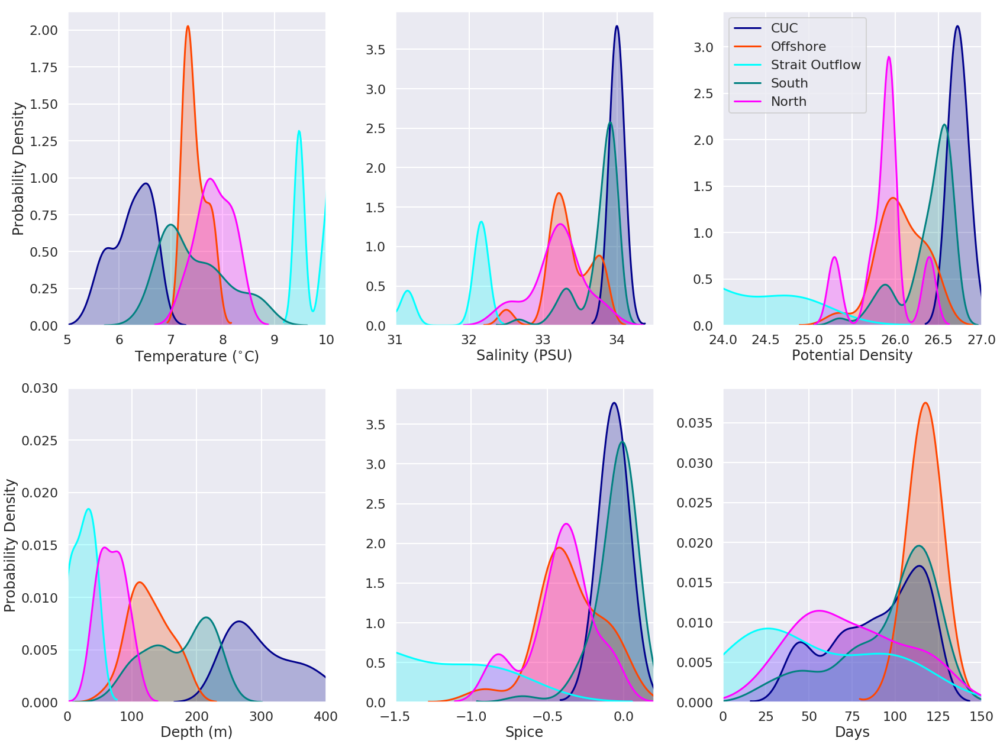

In [26]:
df = pd.DataFrame()

df['Density CUC']     = traj_rho_final_cuc
df['Temperature CUC'] = traj_tem_final_cuc
df['Salinity CUC']    = traj_sal_final_cuc
df['Spice CUC']       = spic_loc_cuc
df['Depth CUC']       = -traj_depth_final_cuc

dp = pd.DataFrame()

dp['Density OFF']     = traj_rho_final_off
dp['Temperature OFF'] = traj_tem_final_off
dp['Salinity OFF']    = traj_sal_final_off
dp['Spice OFF']       = spic_loc_off
dp['Depth OFF']       = -traj_depth_final_off

dg = pd.DataFrame()

dg['Density South']     = traj_rho_final_south
dg['Temperature South'] = traj_tem_final_south
dg['Salinity South']    = traj_sal_final_south
dg['Spice South']       = spic_loc_south
dg['Depth South']       = -traj_depth_final_south

dh = pd.DataFrame()

dh['Density Juan']     = traj_rho_final_juan
dh['Temperature Juan'] = traj_tem_final_juan
dh['Salinity Juan']    = traj_sal_final_juan
dh['Spice Juan']       = spic_loc_juan
dh['Depth Juan']       = -traj_depth_final_juan


dq = pd.DataFrame()

dq['Density North']     = traj_rho_final_north
dq['Temperature North'] = traj_tem_final_north
dq['Salinity North']    = traj_sal_final_north
dq['Spice North']       = spic_loc_north
dq['Depth North']       = -traj_depth_final_north


fig, (ax1,ax2) = plt.subplots(2,3, figsize=(24,18), sharey = False)

# g = df.plot.scatter(x="Observed temperature (deg C)", y="Corrected temperature (deg C)", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)

q = sns.kdeplot(df['Temperature CUC'], ax = ax1[0],shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Temperature OFF'], ax = ax1[0], shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Temperature Juan'], ax = ax1[0], bw=0.1, shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Temperature South'], ax = ax1[0], shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Temperature North'], ax = ax1[0], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]



# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[0].set_xlim(5,10)
ax1[0].set_xlabel('Temperature ($^{\circ}$C)')
ax1[0].set_ylabel('Probability Density')
ax1[0].get_legend().remove()
ax1[0].grid()


q = sns.kdeplot(df['Salinity CUC'], ax = ax1[1], bw=0.1,  shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Salinity OFF'], ax = ax1[1], bw = 0.1, shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Salinity Juan'], ax = ax1[1], bw = 0.1, shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Salinity South'], ax = ax1[1],  bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Salinity North'], ax = ax1[1], bw = 0.2, shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[1].set_xlim(31,34.5)
ax1[1].set_xlabel('Salinity (PSU)')
# ax2.set_ylabel('Density')
ax1[1].grid()
# ax1[2].legend()
ax1[1].get_legend().remove()


q = sns.kdeplot(df['Density CUC'], ax = ax1[2], bw=0.1, shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Density OFF'], ax = ax1[2], shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Density Juan'], ax = ax1[2], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Density South'], ax = ax1[2], bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Density North'], ax = ax1[2], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[2].set_xlim(24,27)
ax1[2].set_xlabel('Potential Density')
# ax2.set_ylabel('Density')
ax1[2].grid()
ax1[2].legend()
# ax1[2].get_legend().remove()


q = sns.kdeplot(df['Depth CUC'], ax = ax2[0], shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Depth OFF'], ax = ax2[0], shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Depth South'], ax = ax2[0], shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Depth Juan'], ax = ax2[0],  shade=True, color = 'Cyan', label = 'Staright Outflow')

sns.kdeplot(dq['Depth North'], ax = ax2[0],  shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]


# ax2[0].legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[0].set_xlabel('Depth (m)')
ax2[0].set_ylabel('Probability Density')
ax2[0].grid()

ax2[0].set_xlim(0,400)
ax2[0].set_ylim(0,0.03)
ax2[0].get_legend().remove()


q = sns.kdeplot(df['Spice CUC'], ax = ax2[1], bw = 0.1,  shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Spice OFF'], ax = ax2[1], shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Spice Juan'], ax = ax2[1], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Spice South'], ax = ax2[1],  bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Spice North'], ax = ax2[1],  shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax2[1].set_xlim(-1.5,0.2)
ax2[1].set_xlabel('Spice')
# ax2.set_ylabel('Density')
ax2[1].grid()
ax2[1].get_legend().remove()

fig.tight_layout()


# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# plt.savefig(path_to_save+'fit_temp.png')



df = pd.DataFrame()

df['Days CUC']     = traj_days_final_cuc


dp = pd.DataFrame()

dp['Days OFF']     = traj_days_final_off


dg = pd.DataFrame()

dg['Days South']     = traj_days_final_south


dh = pd.DataFrame()

dh['Days Juan']     = traj_days_final_juan

dz = pd.DataFrame()

dz['Days North']    = traj_days_final_north




q = sns.kdeplot(df['Days CUC'], ax = ax2[2], bw = 8, shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Days OFF'], ax = ax2[2], bw = 10, shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Days South'], ax = ax2[2], shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Days Juan'], ax = ax2[2], shade=True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dz['Days North'], ax = ax2[2],  shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 



# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[2].set_xlabel('Days')
# ax1.set_ylabel('Probability Density')
ax2[2].grid()
ax2[2].get_legend().remove()

ax2[2].set_xlim(0,150)
fig.tight_layout()


#### For the wrong ones in the 26.4 isopycnal

In [2]:
zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]
y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


# nc_file = nc.Dataset('/data/ssahu/ARIANE/LB_08/LB_08_big_box.nc')

nc_file = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/isopyncal_264/wrong_traj.nc')
nc_tools.show_variables(nc_file)

odict_keys(['init_x', 'init_y', 'init_z', 'init_t', 'init_age', 'init_transp', 'final_x', 'final_y', 'final_z', 'final_t', 'final_age', 'final_transp', 'traj_lon', 'traj_lat', 'traj_depth', 'traj_time', 'traj_temp', 'traj_salt', 'traj_dens'])


In [3]:


init_x = nc_file.variables['init_x']
init_z = nc_file.variables['init_z']
init_age = nc_file.variables['init_age']

traj_depth = nc_file.variables['traj_depth'][:]
traj_lon   = nc_file.variables['traj_lon'][:]
traj_lat   = nc_file.variables['traj_lat'][:]
traj_rho   = nc_file.variables['traj_dens'][:]
traj_tem   = nc_file.variables['traj_temp'][:]
traj_sal   = nc_file.variables['traj_salt'][:]
traj_time  = nc_file.variables['traj_time']


final_age = nc_file.variables['final_age']


# lon1=nc_file.variables['traj_lon'][:]
# lat1=nc_file.variables['traj_lat'][:]
# dep1=nc_file.variables['traj_depth'][:]
x1=nc_file.variables['init_x'][:]
y1=nc_file.variables['init_y'][:]
t1=nc_file.variables['traj_time'][:]

x2=nc_file.variables['final_x'][:]
y2=nc_file.variables['final_y'][:]


final_z = nc_file.variables['final_z'][:]

final_age_days = final_age[:]/(3600)

/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:10: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:12: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type


In [4]:
x_final = []
y_final = []


for i in np.arange(x2.shape[0]):
    x_final = np.append(arr=x_final,values=x_wcvi_slice[np.int(np.rint(x2[i]))-1])
    y_final = np.append(arr=y_final,values=y_wcvi_slice[np.int(np.rint(y2[i]))-1])

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


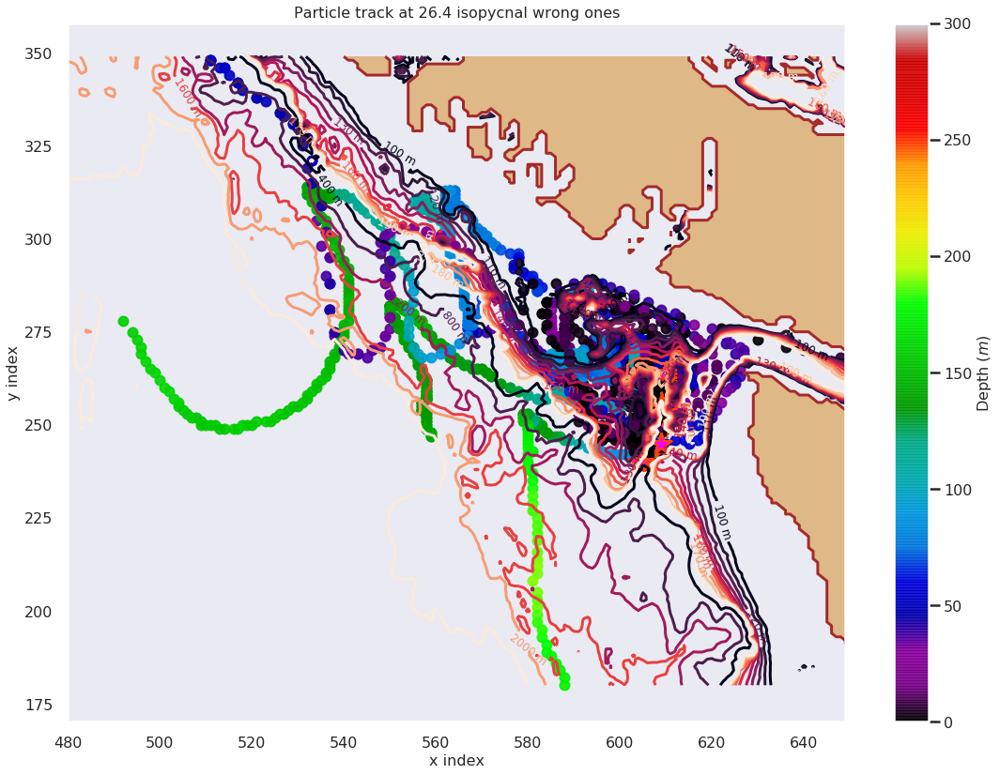

In [22]:


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



file_model = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d_20130429_20131025_grid_T_20130429-20130508.nc')

lon_small = file_model.variables['nav_lon'][1:,1:]
lat_small = file_model.variables['nav_lat'][1:,1:]




cmap=plt.cm.get_cmap('nipy_spectral')
#     cmap = plt.cm.get_cmap('gist_rainbow')
cmap.set_bad('#8b7765')
cmin = 0
cmax = 300

import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


# part = ind[0]
# for part in ind[139]:

for part in np.arange(0,final_age_days.shape[0]):
    for k in np.arange(0,np.int(final_age_days[part]),10):
        y, x = geo_tools.find_closest_model_point(traj_lon[k,part],traj_lat[k,part],\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
        track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[part]))-1], y_wcvi_slice[np.int(np.rint(y1[part]))-1], s=500, marker = '*', c = 'magenta', alpha=0.9, edgecolor= 'orangered')
        q = ax.scatter(x, y, c = np.multiply(-1,np.ma.array(traj_depth[k,part]).filled()), cmap = cmap, vmin = cmin, vmax= cmax, s=100, alpha=0.9)#, edgecolor= 'cyan')

        t = np.int(np.rint(120 - traj_time[k,part]*120))
        level = np.int(np.rint((np.abs(zlevels - (-traj_depth[k,part]))).argmin()))



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


ax.set_title('Particle track at 26.4 isopycnal wrong ones', fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

ax.grid()

cbar = fig.colorbar(q, ax=ax)
cbar.set_label(label='Depth ($m$)', fontsize = 16)
cbar.ax.tick_params(labelsize=16)
fig.tight_layout()





/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


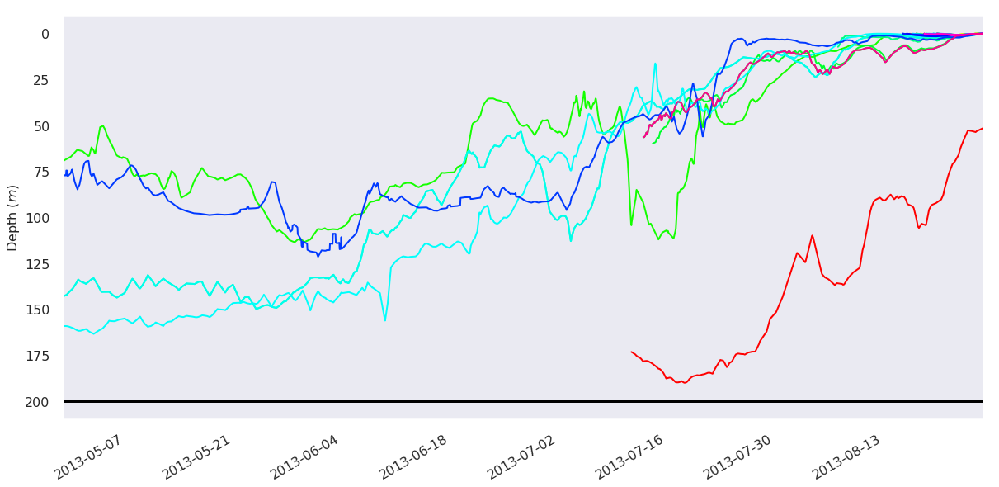

In [21]:
colors = cm.hsv(np.linspace(0, 1, traj_depth.shape[1]))

colors_edge = cm.afmhot_r(np.linspace(0, 1, traj_depth.shape[1]))



date1 = '2013-08-26'
date2 = '2013-04-29'
mydates = pd.date_range(date2, date1, freq= '60min')


fig, ax1 = plt.subplots(1, 1, figsize=(20,10))

for traj_depth_level in np.arange(0,traj_depth.shape[1]):
    
#     if np.ma.is_masked(traj_depth[0,traj_depth_level]) == False:

    ax1.plot(np.flip(mydates, axis=0) , np.multiply(-1,traj_depth[:mydates.shape[0],traj_depth_level]) , color = colors[traj_depth_level] ,linewidth=2)


ax1.axhline(y=200, color = 'k')

ax1.tick_params(axis='both',labelsize =16)
ax1.set_ylabel('Depth ($m$)', fontsize = 16)# and Wind stress (*10^3) (N/m^2)', fontsize = 16)
ax1.grid()
ax1.tick_params(axis='both',labelsize =16, color = colors[traj_depth_level])

ax1.set_ylim(ax1.get_ylim()[::-1]) 
ax1.legend(loc='best', fontsize = 14)
ax1.grid()
ax1.set_xlim(mydates[0], mydates[-1])
fig.autofmt_xdate()



In [26]:
num_north = np.round(a=final_age[(x_final < 580) & (y_final > 300)].shape[0]/final_z.shape[0], decimals=3)

north_percent = 100*num_north

print(north_percent)

num_cuc = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0].shape[0]/final_z.shape[0], decimals = 3)

cuc_percent = 100*num_cuc

print(cuc_percent)

num_south = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0].shape[0]/final_z.shape[0], decimals = 3)

south_percent = 100*num_south

print(south_percent)

### Bigger box
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))



# num = np.where((y_final[x_final_off] < y_final_off))[0].shape[0] + np.where((x_final<x_final_off[0]) & \
#                                                                       ((y_final > 200)&(y_final<320)))[0].shape[0]

# num_off = num/final_z.shape[0]
num_off = off_ind.shape[0]/final_z.shape[0]
off_percent = np.round(a=100*num_off, decimals=1)

print(off_percent)

num_juan = np.round(a=np.where((x_final > 635))[0].shape[0]/final_z.shape[0], decimals=3)

juan_percent = num_juan*100

print(juan_percent)

2.4
0.0
0.8
0.8
0.8


For particles wrongly predicted by model on 26.4 isopycncal


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/figure.py:1743: UserWarning: This figure includes Axes that are not compatible with tight_layout, so its results might be incorrect.
  warnings.warn("This figure includes Axes that are not "


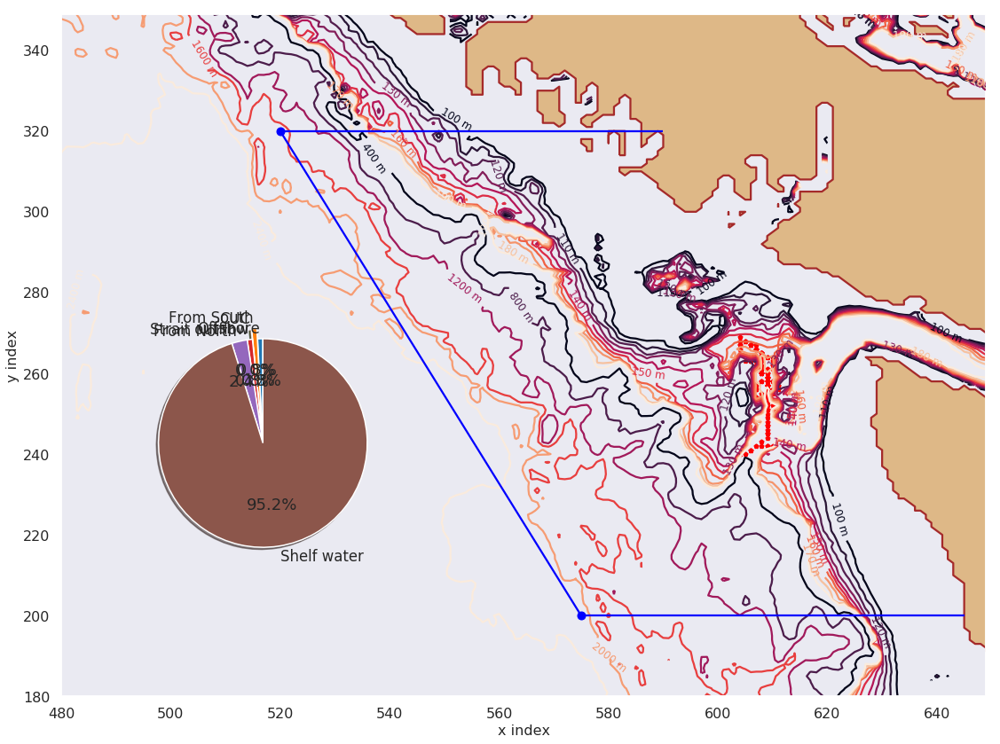

In [27]:
print("For particles wrongly predicted by model on 26.4 isopycncal")


plot_pie_diagram(cuc_percentage=cuc_percent, juan_percentage=juan_percent, \
                 north_percentage=north_percent, south_percentage=south_percent, \
                 off_percentage=off_percent)

### For the 26.5 isopycnal

In [2]:
zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]
y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


# nc_file = nc.Dataset('/data/ssahu/ARIANE/LB_08/LB_08_big_box.nc')

nc_file = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/isopyncal_265/right_traj.nc')
nc_tools.show_variables(nc_file)

odict_keys(['init_x', 'init_y', 'init_z', 'init_t', 'init_age', 'init_transp', 'final_x', 'final_y', 'final_z', 'final_t', 'final_age', 'final_transp', 'traj_lon', 'traj_lat', 'traj_depth', 'traj_time', 'traj_temp', 'traj_salt', 'traj_dens'])


In [3]:


init_x = nc_file.variables['init_x']
init_z = nc_file.variables['init_z']
init_age = nc_file.variables['init_age']

traj_depth = nc_file.variables['traj_depth'][:]
traj_lon   = nc_file.variables['traj_lon'][:]
traj_lat   = nc_file.variables['traj_lat'][:]
traj_rho   = nc_file.variables['traj_dens'][:]
traj_tem   = nc_file.variables['traj_temp'][:]
traj_sal   = nc_file.variables['traj_salt'][:]
traj_time  = nc_file.variables['traj_time']


final_age = nc_file.variables['final_age']


# lon1=nc_file.variables['traj_lon'][:]
# lat1=nc_file.variables['traj_lat'][:]
# dep1=nc_file.variables['traj_depth'][:]
x1=nc_file.variables['init_x'][:]
y1=nc_file.variables['init_y'][:]
t1=nc_file.variables['traj_time'][:]

x2=nc_file.variables['final_x'][:]
y2=nc_file.variables['final_y'][:]


final_z = nc_file.variables['final_z'][:]

final_age_days = final_age[:]/(3600)

/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:10: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:12: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type


In [4]:
x_final = []
y_final = []


for i in np.arange(x2.shape[0]):
    x_final = np.append(arr=x_final,values=x_wcvi_slice[np.int(np.rint(x2[i]))-1])
    y_final = np.append(arr=y_final,values=y_wcvi_slice[np.int(np.rint(y2[i]))-1])

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


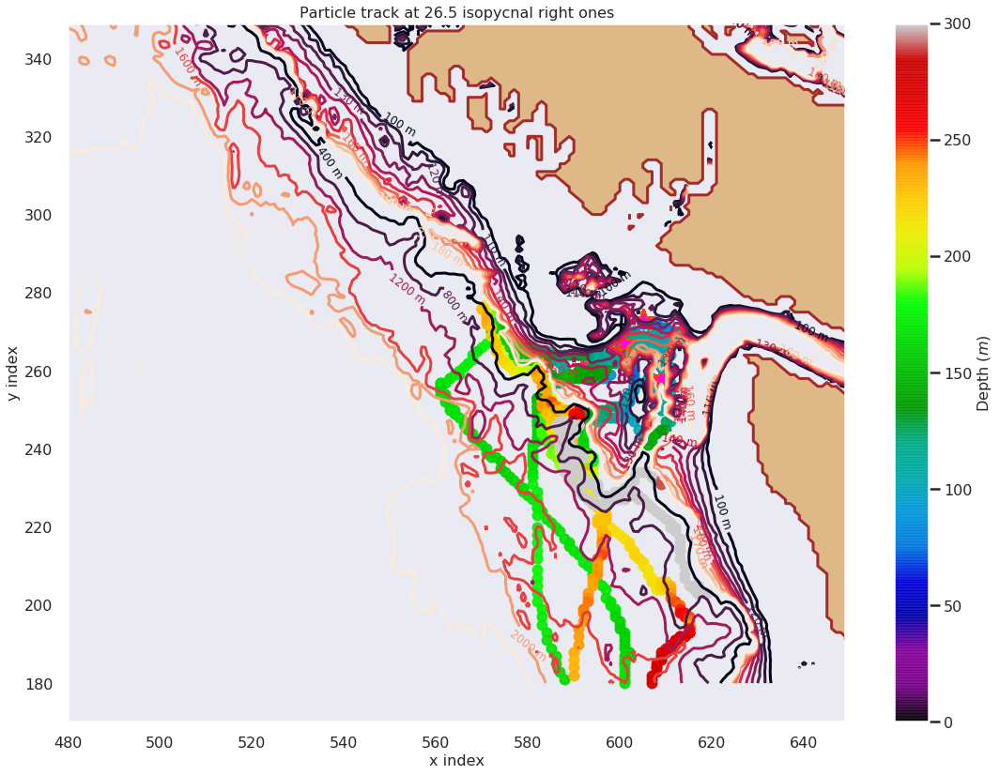

In [8]:


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



file_model = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d_20130429_20131025_grid_T_20130429-20130508.nc')

lon_small = file_model.variables['nav_lon'][1:,1:]
lat_small = file_model.variables['nav_lat'][1:,1:]




cmap=plt.cm.get_cmap('nipy_spectral')
#     cmap = plt.cm.get_cmap('gist_rainbow')
cmap.set_bad('#8b7765')
cmin = 0
cmax = 300

import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


# part = ind[0]
# for part in ind[139]:

for part in np.arange(0,final_age_days.shape[0],50):
    for k in np.arange(0,np.int(final_age_days[part]),10):
        y, x = geo_tools.find_closest_model_point(traj_lon[k,part],traj_lat[k,part],\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
        track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[part]))-1], y_wcvi_slice[np.int(np.rint(y1[part]))-1], s=500, marker = '*', c = 'magenta', alpha=0.9, edgecolor= 'orangered')
        q = ax.scatter(x, y, c = np.multiply(-1,np.ma.array(traj_depth[k,part]).filled()), cmap = cmap, vmin = cmin, vmax= cmax, s=100, alpha=0.9)#, edgecolor= 'cyan')

        t = np.int(np.rint(120 - traj_time[k,part]*120))
        level = np.int(np.rint((np.abs(zlevels - (-traj_depth[k,part]))).argmin()))



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


ax.set_title('Particle track at 26.5 isopycnal right ones', fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

ax.grid()

cbar = fig.colorbar(q, ax=ax)
cbar.set_label(label='Depth ($m$)', fontsize = 16)
cbar.ax.tick_params(labelsize=16)
fig.tight_layout()





In [9]:
num_north = np.round(a=final_age[(x_final < 580) & (y_final > 300)].shape[0]/final_z.shape[0], decimals=3)

north_percent = 100*num_north

print(north_percent)

num_cuc = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0].shape[0]/final_z.shape[0], decimals = 3)

cuc_percent = 100*num_cuc

print(cuc_percent)

num_south = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0].shape[0]/final_z.shape[0], decimals = 3)

south_percent = 100*num_south

print(south_percent)

### Bigger box
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))



# num = np.where((y_final[x_final_off] < y_final_off))[0].shape[0] + np.where((x_final<x_final_off[0]) & \
#                                                                       ((y_final > 200)&(y_final<320)))[0].shape[0]

# num_off = num/final_z.shape[0]
num_off = off_ind.shape[0]/final_z.shape[0]
off_percent = np.round(a=100*num_off, decimals=1)

print(off_percent)

num_juan = np.round(a=np.where((x_final > 635))[0].shape[0]/final_z.shape[0], decimals=3)

juan_percent = num_juan*100

print(juan_percent)

8.4
11.8
40.3
9.5
0.4


In [11]:
sns.set_context('talk')

For particles correctly predicted by model on 26.5 isopycncal


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/figure.py:1743: UserWarning: This figure includes Axes that are not compatible with tight_layout, so its results might be incorrect.
  warnings.warn("This figure includes Axes that are not "


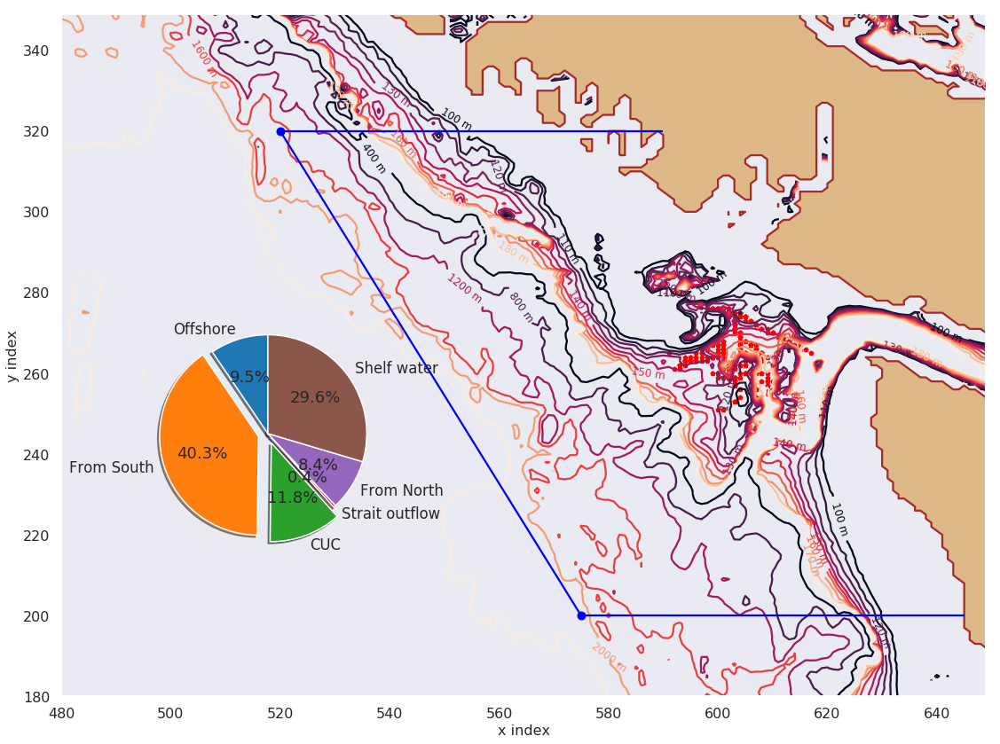

In [12]:
print("For particles correctly predicted by model on 26.5 isopycncal")


plot_pie_diagram(cuc_percentage=cuc_percent, juan_percentage=juan_percent, \
                 north_percentage=north_percent, south_percentage=south_percent, \
                 off_percentage=off_percent)

In [13]:
traj_tem_last   = np.empty_like(final_age_days)
traj_sal_last   = np.empty_like(final_age_days)
traj_rho_last   = np.empty_like(final_age_days)
traj_depth_last = np.empty_like(final_age_days)


for r in np.arange(traj_tem_last.shape[0]):
    traj_tem_last[r]  =  traj_tem[np.int(final_age_days[r]),r]
    traj_sal_last[r]  =  traj_sal[np.int(final_age_days[r]),r]
    traj_rho_last[r]  =  traj_rho[np.int(final_age_days[r]),r]
    traj_depth_last[r] = traj_depth[np.int(final_age_days[r]),r]
    

In [14]:
traj_tem_final_cuc = traj_tem_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_sal_final_cuc = traj_sal_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_rho_final_cuc = traj_rho_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]


traj_depth_final_cuc = traj_depth_last[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_days_final_cuc = final_age_days[(final_z > 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]/24

traj_tem_final_cuc = traj_tem_final_cuc[~(traj_tem_final_cuc == 1.0000000200408773e+20)]

traj_sal_final_cuc = traj_sal_final_cuc[~(traj_sal_final_cuc == 1.0000000200408773e+20)]

traj_depth_final_cuc  = traj_depth_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]
traj_days_final_cuc   = traj_days_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]
traj_rho_final_cuc    = traj_rho_final_cuc[~(traj_rho_final_cuc == 1.0000000200408773e+20)]



traj_tem_final_north = traj_tem_last[((x_final < 580) & (y_final > 320))]
traj_tem_final_north = traj_tem_final_north[~(traj_tem_final_north == 1.0000000200408773e+20)]

traj_sal_final_north = traj_sal_last[((x_final < 580) & (y_final > 320))]
traj_sal_final_north = traj_sal_final_north[~(traj_sal_final_north == 1.0000000200408773e+20)]

traj_rho_final_north = traj_rho_last[((x_final < 580) & (y_final > 320))]
traj_depth_final_north = traj_depth_last[((x_final < 580) & (y_final > 320))]
traj_days_final_north  = final_age_days[((x_final < 580) & (y_final > 320))]/24

traj_depth_final_north  = traj_depth_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]
traj_days_final_north   = traj_days_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]
traj_rho_final_north = traj_rho_final_north[~(traj_rho_final_north == 1.0000000200408773e+20)]



traj_tem_final_south = traj_tem_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_sal_final_south = traj_sal_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_rho_final_south = traj_rho_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]

traj_depth_final_south = traj_depth_last[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]
traj_days_final_south  = final_age_days[(final_z <= 28) & (((x_final < 630) & (y_final < 200)) & \
                                                         ((x_final > 580) & (y_final < 200)))]/24


traj_tem_final_south = traj_tem_final_south[~(traj_tem_final_south == 1.0000000200408773e+20)]

traj_sal_final_south = traj_sal_final_south[~(traj_sal_final_south == 1.0000000200408773e+20)]


traj_depth_final_south = traj_depth_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]
traj_days_final_south  = traj_days_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]
traj_rho_final_south = traj_rho_final_south[~(traj_rho_final_south == 1.0000000200408773e+20)]


traj_tem_final_juan = traj_tem_last[(x_final > 648)]
traj_tem_final_juan = traj_tem_final_juan[~(traj_tem_final_juan == 1.0000000200408773e+20)]

traj_sal_final_juan = traj_sal_last[(x_final > 648)]
traj_sal_final_juan = traj_sal_final_juan[~(traj_sal_final_juan == 1.0000000200408773e+20)]

traj_rho_final_juan = traj_rho_last[(x_final > 648)]

traj_depth_final_juan = traj_depth_last[(x_final > 648)]
traj_days_final_juan = final_age_days[(x_final > 648)]/24

traj_depth_final_juan = traj_depth_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]
traj_days_final_juan  = traj_days_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]
traj_rho_final_juan = traj_rho_final_juan[~(traj_rho_final_juan == 1.0000000200408773e+20)]



x = [510,575]
y = [320,200]

coefficients = np.polyfit(x, y, 1)
x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

# num = np.where((y_final[x_final_off] < y_final_off))[0].shape[0] + np.where((x_final<x_final_off[0]) & \
#                                                                       ((y_final > 200)&(y_final<320)))[0].shape[0]

traj_tem_final_off = []
# traj_tem_final_off = np.append(arr=traj_tem_final_off, \
#                                values= traj_tem_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_tem_final_off = np.append(arr=traj_tem_final_off, \
#                                values = traj_tem_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
# traj_tem_final_off = traj_tem_final_off[~(traj_tem_final_off == 1.0000000200408773e+20)]

traj_sal_final_off = []
# traj_sal_final_off = np.append(arr=traj_sal_final_off, \
#                                values= traj_sal_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_sal_final_off = np.append(arr=traj_sal_final_off, \
#                                values = traj_sal_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
# traj_sal_final_off = traj_sal_final_off[~(traj_sal_final_off == 1.0000000200408773e+20)]


traj_rho_final_off = []

# traj_rho_final_off = np.append(arr=traj_rho_final_off, \
#                                values= traj_rho_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_rho_final_off = np.append(arr=traj_rho_final_off, \
#                                values = traj_rho_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])


# traj_depth_final_off = []
# traj_depth_final_off = np.append(arr=traj_depth_final_off, \
#                                values= traj_depth_last[np.where((y_final[x_final_off] < y_final_off))[0]])
# traj_depth_final_off = np.append(arr=traj_depth_final_off, \
#                                values = traj_depth_last[np.where((x_final<x_final_off[0]) & \
#                                                                ((y_final > 200)&(y_final<320)))[0]])
traj_depth_final_off = []
traj_days_final_off = []

for l in np.arange(off_ind.shape[0]):

    traj_depth_final_off = np.append(arr=traj_depth_final_off, values=traj_depth_last[np.int(off_ind[l])])
    traj_days_final_off = np.append(arr=traj_days_final_off, values=final_age_days[np.int(off_ind[l])]/24)
    traj_rho_final_off   = np.append(arr=traj_rho_final_off, values=traj_rho_last[np.int(off_ind[l])])
    traj_tem_final_off   = np.append(arr=traj_tem_final_off, values=traj_tem_last[np.int(off_ind[l])])
    traj_sal_final_off   = np.append(arr=traj_sal_final_off, values=traj_sal_last[np.int(off_ind[l])])


traj_depth_final_off = traj_depth_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]
traj_days_final_off  = traj_days_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]
traj_rho_final_off = traj_rho_final_off[~(traj_rho_final_off == 1.0000000200408773e+20)]

In [15]:
pressure_loc_cuc = np.empty_like(traj_depth_final_cuc)
SA_loc_cuc       = np.empty_like(traj_depth_final_cuc)
CT_loc_cuc       = np.empty_like(traj_depth_final_cuc)
spic_loc_cuc     = np.empty_like(traj_depth_final_cuc)



for i in np.arange(traj_depth_final_cuc.shape[0]):
    
    pressure_loc_cuc[i] = gsw.p_from_z(traj_depth_final_cuc[i],np.mean(traj_lat))
    
    SA_loc_cuc[i] = gsw.SA_from_SP(traj_sal_final_cuc[i], pressure_loc_cuc[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_cuc[i] = gsw.CT_from_pt(traj_sal_final_cuc[i], traj_tem_final_cuc[i])
    
    spic_loc_cuc[i] = gsw.spiciness0(SA_loc_cuc[i], CT_loc_cuc[i])
    
pressure_loc_off = np.empty_like(traj_depth_final_off)
SA_loc_off       = np.empty_like(traj_depth_final_off)
CT_loc_off       = np.empty_like(traj_depth_final_off)
spic_loc_off     = np.empty_like(traj_depth_final_off)



for i in np.arange(traj_depth_final_off.shape[0]):
    
    pressure_loc_off[i] = gsw.p_from_z(traj_depth_final_off[i],np.mean(traj_lat))
    
    SA_loc_off[i] = gsw.SA_from_SP(traj_sal_final_off[i], pressure_loc_off[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_off[i] = gsw.CT_from_pt(traj_sal_final_off[i], traj_tem_final_off[i])
    
    spic_loc_off[i] = gsw.spiciness0(SA_loc_off[i], CT_loc_off[i])
    
pressure_loc_south = np.empty_like(traj_depth_final_south)
SA_loc_south       = np.empty_like(traj_depth_final_south)
CT_loc_south       = np.empty_like(traj_depth_final_south)
spic_loc_south     = np.empty_like(traj_depth_final_south)



for i in np.arange(traj_depth_final_south.shape[0]):
    
    pressure_loc_south[i] = gsw.p_from_z(traj_depth_final_south[i],np.mean(traj_lat))
    
    SA_loc_south[i] = gsw.SA_from_SP(traj_sal_final_south[i], pressure_loc_south[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_south[i] = gsw.CT_from_pt(traj_sal_final_south[i], traj_tem_final_south[i])
    
    spic_loc_south[i] = gsw.spiciness0(SA_loc_south[i], CT_loc_south[i])
    
pressure_loc_north= np.empty_like(traj_depth_final_north)
SA_loc_north       = np.empty_like(traj_depth_final_north)
CT_loc_north       = np.empty_like(traj_depth_final_north)
spic_loc_north     = np.empty_like(traj_depth_final_north)



for i in np.arange(traj_depth_final_north.shape[0]):
    
    pressure_loc_north[i] = gsw.p_from_z(traj_depth_final_north[i],np.mean(traj_lat))
    
    SA_loc_north[i] = gsw.SA_from_SP(traj_sal_final_north[i], pressure_loc_north[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_north[i] = gsw.CT_from_pt(traj_sal_final_north[i], traj_tem_final_north[i])
    
    spic_loc_north[i] = gsw.spiciness0(SA_loc_north[i], CT_loc_north[i])
    

pressure_loc_juan= np.empty_like(traj_depth_final_juan)
SA_loc_juan       = np.empty_like(traj_depth_final_juan)
CT_loc_juan       = np.empty_like(traj_depth_final_juan)
spic_loc_juan     = np.empty_like(traj_depth_final_juan)



for i in np.arange(traj_depth_final_juan.shape[0]):
    
    pressure_loc_juan[i] = gsw.p_from_z(traj_depth_final_juan[i],np.mean(traj_lat))
    
    SA_loc_juan[i] = gsw.SA_from_SP(traj_sal_final_juan[i], pressure_loc_juan[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_juan[i] = gsw.CT_from_pt(traj_sal_final_juan[i], traj_tem_final_juan[i])
    
    spic_loc_juan[i] = gsw.spiciness0(SA_loc_juan[i], CT_loc_juan[i])
    

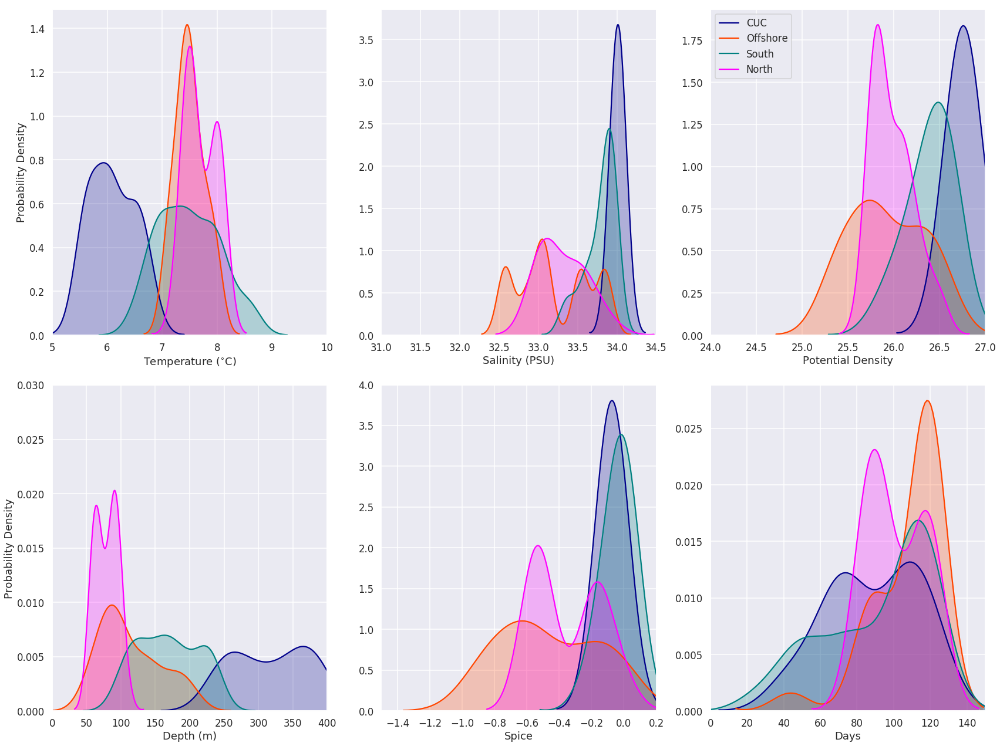

In [16]:
df = pd.DataFrame()

df['Density CUC']     = traj_rho_final_cuc
df['Temperature CUC'] = traj_tem_final_cuc
df['Salinity CUC']    = traj_sal_final_cuc
df['Spice CUC']       = spic_loc_cuc
df['Depth CUC']       = -traj_depth_final_cuc

dp = pd.DataFrame()

dp['Density OFF']     = traj_rho_final_off
dp['Temperature OFF'] = traj_tem_final_off
dp['Salinity OFF']    = traj_sal_final_off
dp['Spice OFF']       = spic_loc_off
dp['Depth OFF']       = -traj_depth_final_off

dg = pd.DataFrame()

dg['Density South']     = traj_rho_final_south
dg['Temperature South'] = traj_tem_final_south
dg['Salinity South']    = traj_sal_final_south
dg['Spice South']       = spic_loc_south
dg['Depth South']       = -traj_depth_final_south

dh = pd.DataFrame()

dh['Density Juan']     = traj_rho_final_juan
dh['Temperature Juan'] = traj_tem_final_juan
dh['Salinity Juan']    = traj_sal_final_juan
dh['Spice Juan']       = spic_loc_juan
dh['Depth Juan']       = -traj_depth_final_juan


dq = pd.DataFrame()

dq['Density North']     = traj_rho_final_north
dq['Temperature North'] = traj_tem_final_north
dq['Salinity North']    = traj_sal_final_north
dq['Spice North']       = spic_loc_north
dq['Depth North']       = -traj_depth_final_north


fig, (ax1,ax2) = plt.subplots(2,3, figsize=(24,18), sharey = False)

# g = df.plot.scatter(x="Observed temperature (deg C)", y="Corrected temperature (deg C)", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)

q = sns.kdeplot(df['Temperature CUC'], ax = ax1[0],shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Temperature OFF'], ax = ax1[0], shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Temperature Juan'], ax = ax1[0], bw=0.1, shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Temperature South'], ax = ax1[0], shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Temperature North'], ax = ax1[0], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]



# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[0].set_xlim(5,10)
ax1[0].set_xlabel('Temperature ($^{\circ}$C)')
ax1[0].set_ylabel('Probability Density')
ax1[0].get_legend().remove()
ax1[0].grid()


q = sns.kdeplot(df['Salinity CUC'], ax = ax1[1], bw=0.1,  shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Salinity OFF'], ax = ax1[1], bw = 0.1, shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Salinity Juan'], ax = ax1[1], bw = 0.1, shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Salinity South'], ax = ax1[1],  bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Salinity North'], ax = ax1[1], bw = 0.2, shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[1].set_xlim(31,34.5)
ax1[1].set_xlabel('Salinity (PSU)')
# ax2.set_ylabel('Density')
ax1[1].grid()
# ax1[2].legend()
ax1[1].get_legend().remove()


q = sns.kdeplot(df['Density CUC'], ax = ax1[2],bw=0.2, shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Density OFF'], ax = ax1[2], shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Density Juan'], ax = ax1[2], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Density South'], ax = ax1[2], bw=0.2, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Density North'], ax = ax1[2], shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[2].set_xlim(24,27)
ax1[2].set_xlabel('Potential Density')
# ax2.set_ylabel('Density')
ax1[2].grid()
ax1[2].legend()
# ax1[2].get_legend().remove()


q = sns.kdeplot(df['Depth CUC'], ax = ax2[0], shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Depth OFF'], ax = ax2[0], shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Depth South'], ax = ax2[0], shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Depth Juan'], ax = ax2[0],  shade=True, color = 'Cyan', label = 'Staright Outflow')

sns.kdeplot(dq['Depth North'], ax = ax2[0],  shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]


# ax2[0].legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[0].set_xlabel('Depth (m)')
ax2[0].set_ylabel('Probability Density')
ax2[0].grid()

ax2[0].set_xlim(0,400)
ax2[0].set_ylim(0,0.03)
ax2[0].get_legend().remove()


q = sns.kdeplot(df['Spice CUC'], ax = ax2[1], bw=0.1, shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Spice OFF'], ax = ax2[1], shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Spice Juan'], ax = ax2[1], shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Spice South'], ax = ax2[1],  bw=0.1, shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Spice North'], ax = ax2[1],  bw=0.1, shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax2[1].set_xlim(-1.5,0.2)
ax2[1].set_xlabel('Spice')
# ax2.set_ylabel('Density')
ax2[1].grid()
ax2[1].get_legend().remove()

fig.tight_layout()


# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# plt.savefig(path_to_save+'fit_temp.png')



df = pd.DataFrame()

df['Days CUC']     = traj_days_final_cuc


dp = pd.DataFrame()

dp['Days OFF']     = traj_days_final_off


dg = pd.DataFrame()

dg['Days South']     = traj_days_final_south


dh = pd.DataFrame()

dh['Days Juan']     = traj_days_final_juan

dz = pd.DataFrame()

dz['Days North']    = traj_days_final_north




q = sns.kdeplot(df['Days CUC'], ax = ax2[2], shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Days OFF'], ax = ax2[2], bw = 10, shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Days South'], ax = ax2[2], shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Days Juan'], ax = ax2[2], shade=True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dz['Days North'], ax = ax2[2],  shade=True, color = 'Magenta', label = 'North')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 



# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[2].set_xlabel('Days')
# ax1.set_ylabel('Probability Density')
ax2[2].grid()
ax2[2].get_legend().remove()

ax2[2].set_xlim(0,150)
fig.tight_layout()
